In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import scipy
import scipy.stats
from scipy import signal
import h5py
import pandas as pd
import cv2
import skimage.feature
from sklearn.decomposition import PCA
import sklearn
import os
import sklearn.decomposition
from sklearn.neighbors import KernelDensity

from utils import behavioral_segmentation
from utils import LFP_Processor
from utils.utils import construct_DEG_csv, to_percentile 

plt.rcParams['figure.figsize'] = (16, 9)

In [2]:
# Papermill parameters 
# This cell has the parameters tag (View -> Cell Toolbar -> Tags)
# These variables can be overriden via command-line at runtime

lfp_file = '/LFP-Behavior/data/processed/aligned_hippo_lfp_50hz.npy' # time-aligned LFP data
lfp_fs = 50 # sampling frequency of time-aligned LFP data

xMM_file = '/LFP-Behavior/data/processed/aligned_xMM_sub10hz.npy' # time-aligned xMM data
xMM_fs = 10 # sampling frequency of time-aligned xMM data

yMM_file = '/LFP-Behavior/data/processed/aligned_yMM_sub10hz.npy' # time-aligned yMM data
yMM_fs = 10 # sampling frequency of time-aligned yMM data

sect_file = '/LFP-Behavior/data/processed/aligned_sect_sub10hz.npy' # time-aligned yMM data
sect_fs = 10 # sampling frequency of time-aligned yMM data

deg_path = 'DeepEthogram/stationary_rat_single_port_trimmed_5/' # DeepEthogram Project Directory

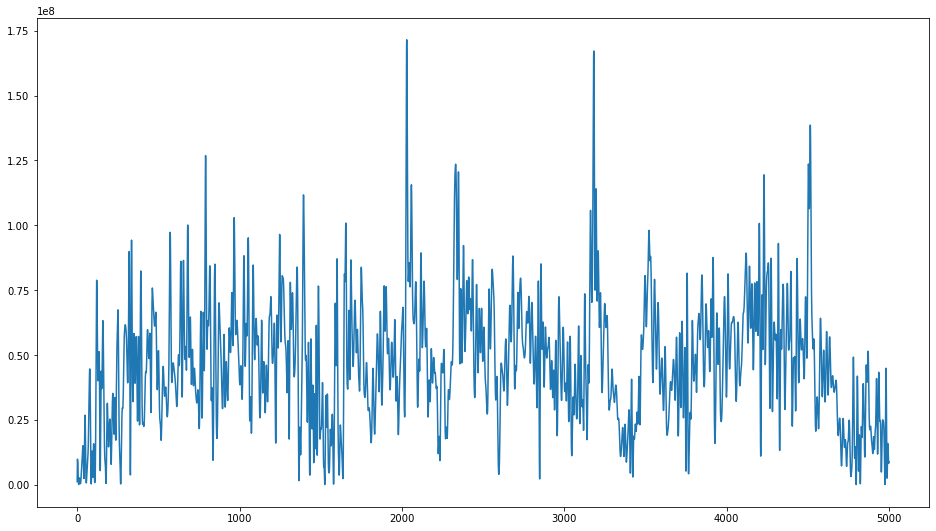

(56962,)


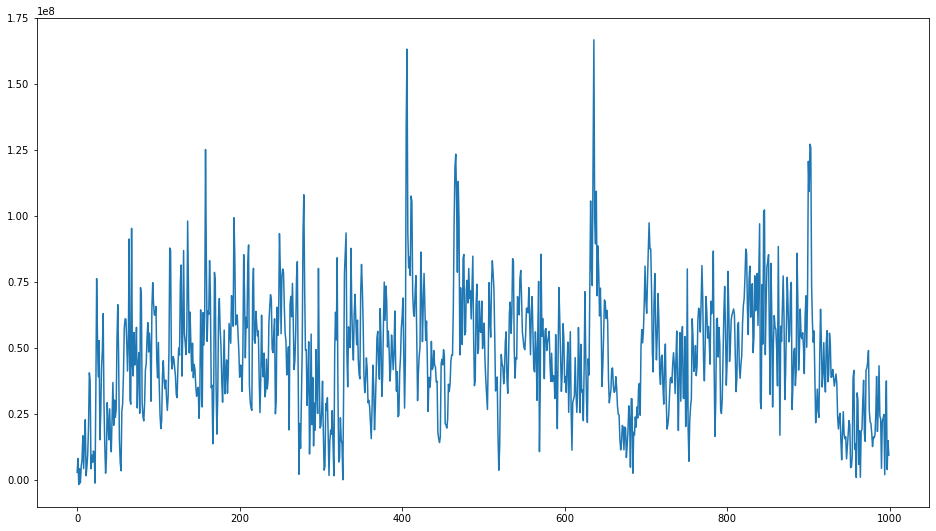

Pearson corr: 0.9475733010635902


In [3]:
# Demodulated LFP Theta Band
theta_50hz = LFP_Processor.demodulate(lfp = np.load(lfp_file), low=5, high=11, fs=lfp_fs, verbose = 0)
theta_power_50hz = np.square(np.abs(theta_50hz))

plt.plot(theta_power_50hz[:5000])
plt.show()

#theta_10hz = scipy.signal.decimate(theta_modulation_50hz, q=5.1, ftype='fir', zero_phase=True)
theta_sub10hz = scipy.signal.resample(theta_power_50hz, int(len(theta_power_50hz)/(50/(1526/152.7))) )[:57000]
print(theta_sub10hz.shape)

plt.plot(theta_sub10hz[:1000])
plt.show()

corr, _ = scipy.stats.pearsonr(theta_power_50hz[:5000][::5], theta_sub10hz[:1000])
print("Pearson corr:", corr)
assert corr > 0.9

35
11


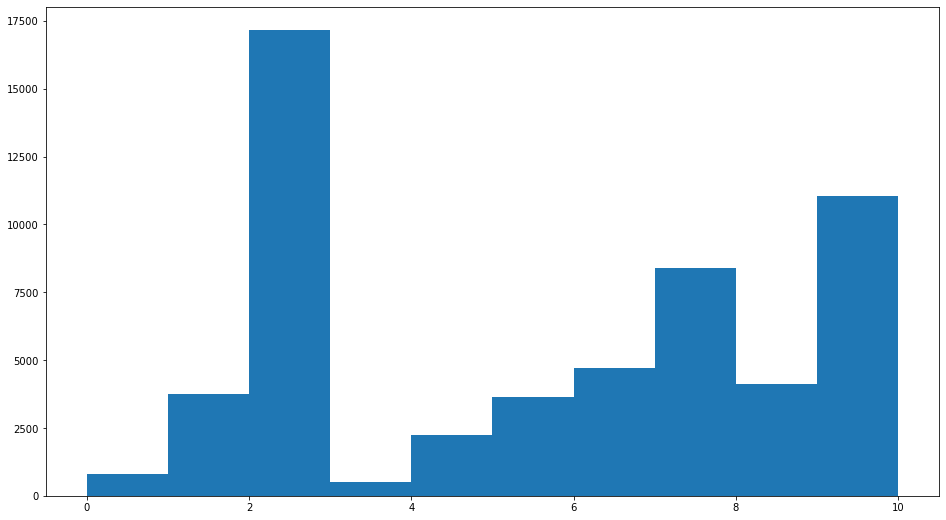

In [4]:
sect_10hz = np.load(sect_file)
plt.hist(sect_10hz, bins=np.arange(11))
segments = behavioral_segmentation.extract_segments(sect_10hz, [7, 8, 9])
segments = [seg for seg in segments if seg[2] == 9.0]

# This segment is too short to be used
i = np.argmin([segments[i][1] - segments[i][0] for i in range(len(segments))])
print(i)
segments = np.delete(segments, i, axis=0)

trimmed_segments = np.load('data/datasets/stationary_rat/trimmed_segments.npy')
print(np.min([trimmed_segments[i][1] - trimmed_segments[i][0] for i in range(len(trimmed_segments))]))

In [5]:
def extract_frames(vid_index):
    vid_folder = '{}_{}_{}'.format(*segments[vid_index])
    vid_path = 'data/datasets/stationary_rat/videos/{}/{}/'.format(vid_folder, vid_folder)

    s, e, sect = trimmed_segments[vid_index]
    #s, e, sect = segments[vid_index]
    print(vid_path)
    frames = []
    for i in range(s, e):
        img = cv2.imread(vid_path + str(i) + '.jpg')
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        gray = cv2.normalize(gray, None, 0, 1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        #ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
        frames.append(gray.flatten())

    frames = np.array(frames)
    mean = np.mean(frames, axis=0)
    frames = frames - mean
    
    return frames

# DeepEthogram

In [6]:
def extract_deg_features(segment):
    s, e, sect = segment
    s, e, sect = int(s), int(e), int(sect)
    #print("Segment:", s,e,sect)
    filename = os.path.join(deg_path + 'DATA/', '{}_{}_{}/{}_{}_{}_outputs.h5'.format(s, e, sect, s, e, sect))

    with h5py.File(filename, "r") as f:
        # List all groups
        #print(e-s)
        #print("Keys: %s" % f['resnet18'].keys())
        flow = np.array(f['resnet18']['flow_features'])
        spatial = np.array(f['resnet18']['spatial_features'])
        return flow.T, spatial.T

# PCA

In [7]:
def pca(frames, num_modes = 50):
    U, S, V_h = np.linalg.svd(np.array(frames), full_matrices=False)
    
    # PC = XV = US
    pc = np.matmul(U, np.diag(S))
    
    modes = pc[:num_modes,:]
    
    return modes

# Wavelet Decomposition

In [39]:
def cwt_transform(mode, verbose = False):
    w = 3
    t, dt = np.linspace(0, (len(mode)-1)/10, len(mode), retstep=True)
    freq = np.linspace(1, 5, 10)
    widths = w*10 / (2*freq*np.pi)

    cwtm = scipy.signal.cwt(mode, signal.morlet2, widths, w=w)
    
    if(verbose):
        plt.pcolormesh(t, freq , np.abs(cwtm), cmap='viridis', shading='gouraud')
        #plt.colorbar()
        plt.title('Postural Mode Spectrogram')
        plt.xlabel('Time')
        plt.ylabel('Freq')
        plt.show()
    
    return np.abs(cwtm)

def craft_training_data(modes, segments):
    X = []
    segment_indices = np.cumsum([0] + [s[1] - s[0] for s in segments])
    print(segment_indices)
    
    for mode in modes:
        spectrogram = []
        for i in range(len(segment_indices)-1):
            s, e = segment_indices[i], segment_indices[i+1]
            segment_spect = cwt_transform(mode[s:e], verbose=0)
            print(segment_spect.shape)
            spectrogram.append(np.array(segment_spect))
            print(len(spectrogram))
        print(np.hstack(spectrogram).shape)
        X.append(np.hstack(spectrogram))
        
    X = np.vstack(X).T
    return X

# T-SNE

In [9]:
from sklearn.manifold import TSNE

In [10]:
data_percentile = to_percentile(theta_sub10hz, trimmed_segments)

In [191]:
frames = []
theta_percentile = []
for i in range(len(segments)):
    s, e, sect = trimmed_segments[i]
    #print(s, e, sect)
    #print(i)  
    frames.append(extract_frames(i))
    theta_percentile += list(data_percentile[s:e])
frames = np.array(frames)
frames = np.concatenate(frames)

theta_percentile = np.array(theta_percentile)

frames.shape

data/datasets/stationary_rat/videos/662_698_9/662_698_9/
data/datasets/stationary_rat/videos/1940_2160_9/1940_2160_9/
data/datasets/stationary_rat/videos/2604_2664_9/2604_2664_9/
data/datasets/stationary_rat/videos/3378_3572_9/3378_3572_9/
data/datasets/stationary_rat/videos/4382_4603_9/4382_4603_9/
data/datasets/stationary_rat/videos/5131_5324_9/5131_5324_9/
data/datasets/stationary_rat/videos/6030_6245_9/6030_6245_9/
data/datasets/stationary_rat/videos/6593_6617_9/6593_6617_9/
data/datasets/stationary_rat/videos/7583_7791_9/7583_7791_9/
data/datasets/stationary_rat/videos/8598_8809_9/8598_8809_9/
data/datasets/stationary_rat/videos/9371_9563_9/9371_9563_9/
data/datasets/stationary_rat/videos/10369_10573_9/10369_10573_9/
data/datasets/stationary_rat/videos/11386_11597_9/11386_11597_9/
data/datasets/stationary_rat/videos/12445_12649_9/12445_12649_9/
data/datasets/stationary_rat/videos/13195_13441_9/13195_13441_9/
data/datasets/stationary_rat/videos/14106_14312_9/14106_14312_9/
data/dat

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  if __name__ == '__main__':


(8971, 22000)

In [11]:
bins2 = [0, 50, 100]
theta_binary= np.digitize(data_percentile, bins2, right=True) - 1

In [12]:
theta_binary.shape

(56962,)

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 0, the array at index 0 has size 8971 and the array at index 1 has size 1428

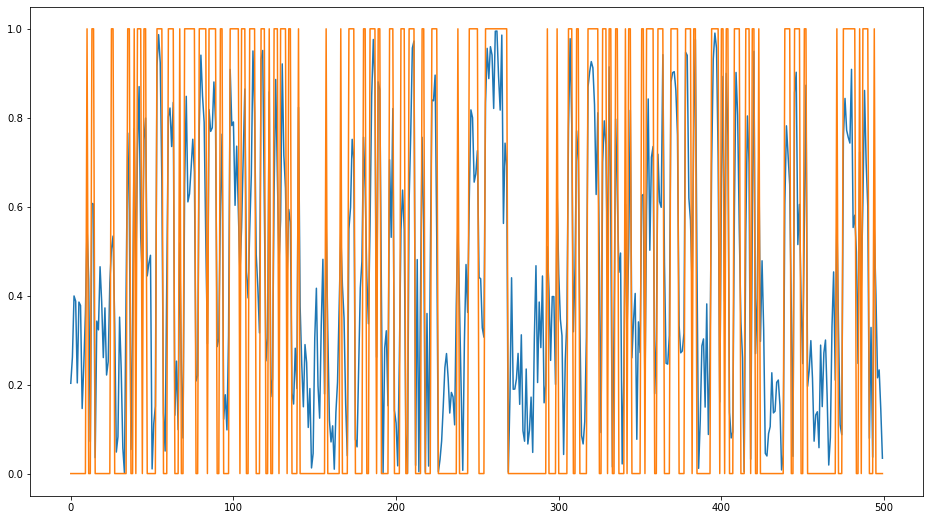

In [317]:
plt.plot(theta_percentile[:500]/100)
plt.plot(theta_binary[:500])

scipy.stats.spearmanr(theta_percentile, labels)[0]

In [318]:
pca = sklearn.decomposition.PCA(n_components=3)
pca.fit(frames)

PCA(n_components=3)

In [319]:
np.sum(pca.explained_variance_ratio_)

0.35337988

In [320]:
modes = pca.transform(frames).T

In [321]:
modes.shape

(3, 8971)

In [322]:
X = craft_training_data(modes, trimmed_segments)
X_total = np.array(X)
#X_total = np.concatenate(X_total)

[   0   20  228  271  453  652  833 1031 1043 1230 1428 1606 1796 1990
 2180 2400 2590 2772 2948 3121 3289 3320 3497 3671 3851 4018 4191 4352
 4363 4536 4723 4745 4912 5105 5122 5292 5315 5336 5513 5673 5836 6006
 6165 6358 6525 6714 6725 6898 7069 7243 7408 7571 7727 7901 8055 8209
 8378 8396 8562 8815 8827 8971]
(5, 20)
1
(5, 208)
2
(5, 43)
3
(5, 182)
4
(5, 199)
5
(5, 181)
6
(5, 198)
7
(5, 12)
8
(5, 187)
9
(5, 198)
10
(5, 178)
11
(5, 190)
12
(5, 194)
13
(5, 190)
14
(5, 220)
15
(5, 190)
16
(5, 182)
17
(5, 176)
18
(5, 173)
19
(5, 168)
20
(5, 31)
21
(5, 177)
22
(5, 174)
23
(5, 180)
24
(5, 167)
25
(5, 173)
26
(5, 161)
27
(5, 11)
28
(5, 173)
29
(5, 187)
30
(5, 22)
31
(5, 167)
32
(5, 193)
33
(5, 17)
34
(5, 170)
35
(5, 23)
36
(5, 21)
37
(5, 177)
38
(5, 160)
39
(5, 163)
40
(5, 170)
41
(5, 159)
42
(5, 193)
43
(5, 167)
44
(5, 189)
45
(5, 11)
46
(5, 173)
47
(5, 171)
48
(5, 174)
49
(5, 165)
50
(5, 163)
51
(5, 156)
52
(5, 174)
53
(5, 154)
54
(5, 154)
55
(5, 169)
56
(5, 18)
57
(5, 166)
58
(5, 253)

In [323]:
norm_factor = np.sum(X_total, axis=1)
X_norm = X_total.T/norm_factor
X_norm = X_norm.T

In [324]:
def kl_dist(x, y):
    return np.sum(scipy.special.rel_entr(x, y))

In [325]:
X_norm.shape

(8971, 15)

In [32]:
params = {'t_shift': [2], 'plex': [200]}

In [313]:
flow.T.shape

(144, 512)

20 250
8971
(1024, 8971)
[t-SNE] Computing 751 nearest neighbors...
[t-SNE] Indexed 8971 samples in 2.963s...
[t-SNE] Computed neighbors for 8971 samples in 14.587s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8971
[t-SNE] Computed conditional probabilities for sample 2000 / 8971
[t-SNE] Computed conditional probabilities for sample 3000 / 8971
[t-SNE] Computed conditional probabilities for sample 4000 / 8971
[t-SNE] Computed conditional probabilities for sample 5000 / 8971
[t-SNE] Computed conditional probabilities for sample 6000 / 8971
[t-SNE] Computed conditional probabilities for sample 7000 / 8971
[t-SNE] Computed conditional probabilities for sample 8000 / 8971
[t-SNE] Computed conditional probabilities for sample 8971 / 8971
[t-SNE] Mean sigma: 0.029019
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.233532
[t-SNE] KL divergence after 1000 iterations: 0.528569


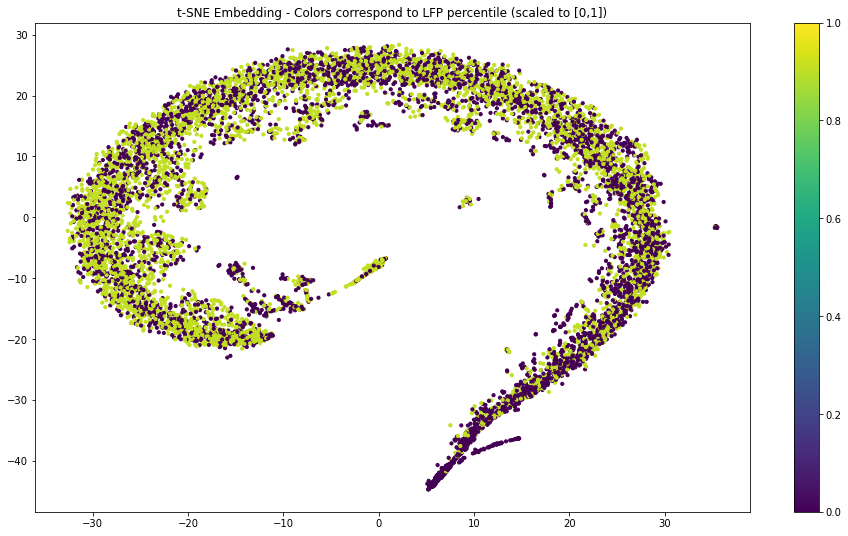

In [339]:
for t_shift in params['t_shift']:
    for plex in params['plex']:
        print(t_shift, plex)
        
        yMM = np.load(yMM_file)
        v_y = np.diff(yMM)/(1526/152.7)
        
        labels = []
        X = []
        for i in range(len(trimmed_segments)):
            s, e, sect = trimmed_segments[i]
            flow, spatial = extract_deg_features(trimmed_segments[i])
            feature = np.vstack([flow, spatial])
            #print(feature.shape)
            X.append(feature)
            labels += list(theta_binary[s:e])
            
        X = np.array(np.hstack(X))
        print(len(labels))
        print(X.shape)

        X_embedded = TSNE(n_components=2, perplexity=plex, verbose = 1, n_iter = 1000, n_jobs = -1, learning_rate=200).fit_transform(X.T)

        plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 10, color = cm.viridis(np.array(labels)/1.1))
        plt.title('t-SNE Embedding - Colors correspond to LFP percentile (scaled to [0,1])')
        plt.colorbar()
        plt.show()

In [306]:
theta_binary/1.1

array([0.        , 0.        , 0.        , ..., 0.90909091, 0.        ,
       0.        ])

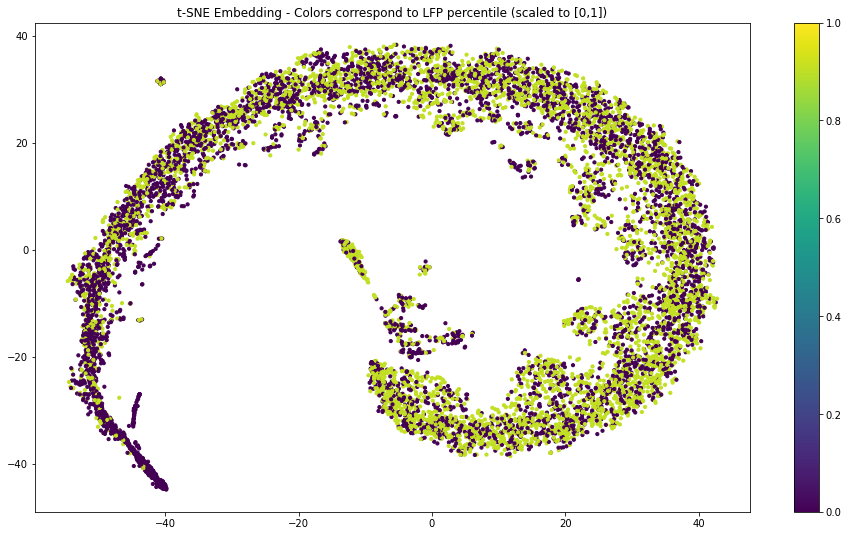

In [305]:
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 10, color = cm.viridis(np.array(theta_binary)/1.1))
plt.title('t-SNE Embedding - Colors correspond to LFP percentile (scaled to [0,1])')
plt.colorbar()
plt.show()

In [15]:
for t_shift in params['t_shift']:
    for plex in params['plex']:
        print(t_shift, plex)
        
        yMM = np.load(yMM_file)
        v_y = np.diff(yMM)/(1526/152.7)
        
        labels = []
        X = []
        for i in range(len(trimmed_segments)):
            s, e, sect = trimmed_segments[i]
            flow, spatial = extract_deg_features(trimmed_segments[i])
            feature = np.vstack([flow, spatial])
            #print(feature.shape)
            X.append(feature)
            labels += list(data_percentile[s:e])
            
        X = np.array(np.hstack(X))
        print(len(labels))
        print(X.shape)

        X_embedded = TSNE(n_components=2, perplexity=plex, verbose = 1, n_iter = 1000, n_jobs = -1, learning_rate=200).fit_transform(X.T)

        plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 10, color = cm.viridis(np.array(labels)/100))
        plt.title('t-SNE Embedding - Colors correspond to LFP percentile (scaled to [0,1])')
        plt.colorbar()
        plt.show()

20 250
8971
(1024, 8971)
[t-SNE] Computing 751 nearest neighbors...
[t-SNE] Indexed 8971 samples in 3.185s...


KeyboardInterrupt: 

In [333]:
len(theta_binary)

8971

2 200
(10, 8849)
[t-SNE] Computing 601 nearest neighbors...
[t-SNE] Indexed 8849 samples in 0.020s...
[t-SNE] Computed neighbors for 8849 samples in 1.699s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8849
[t-SNE] Computed conditional probabilities for sample 2000 / 8849
[t-SNE] Computed conditional probabilities for sample 3000 / 8849
[t-SNE] Computed conditional probabilities for sample 4000 / 8849
[t-SNE] Computed conditional probabilities for sample 5000 / 8849
[t-SNE] Computed conditional probabilities for sample 6000 / 8849
[t-SNE] Computed conditional probabilities for sample 7000 / 8849
[t-SNE] Computed conditional probabilities for sample 8000 / 8849
[t-SNE] Computed conditional probabilities for sample 8849 / 8849
[t-SNE] Mean sigma: 0.125789
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.713867
[t-SNE] KL divergence after 1000 iterations: 1.337320


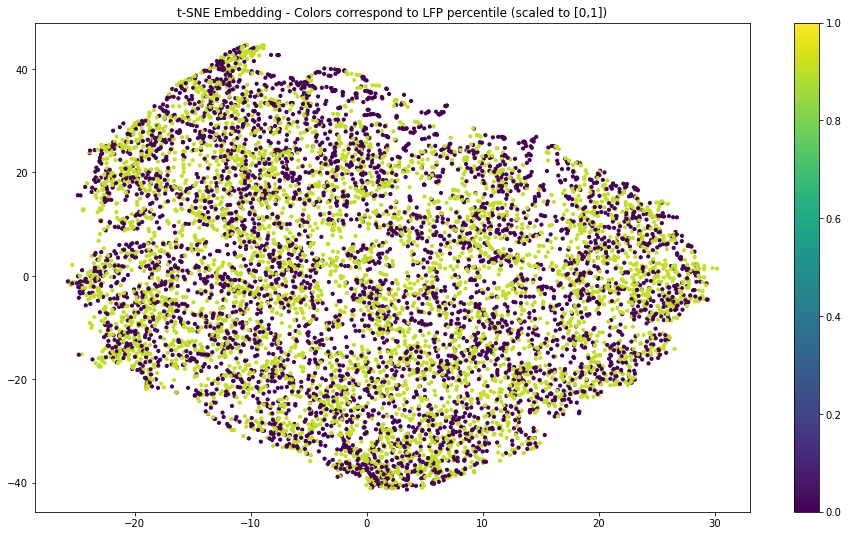

In [33]:
for t_shift in params['t_shift']:
    for plex in params['plex']:
        print(t_shift, plex)
        
        yMM = np.load(yMM_file)
        v_y = np.diff(yMM)/(1526/152.7)
        
        labels = []
        X = []
        for i in range(len(trimmed_segments)):
            s, e, sect = trimmed_segments[i]
            head_pos = yMM[s:e-t_shift]
            head_pos = head_pos - np.mean(head_pos, axis=0)
            head_pos = scipy.stats.zscore(head_pos)
    
            if(len(head_pos) >= t_shift):
                toeplitz = scipy.linalg.toeplitz(head_pos[:t_shift], head_pos)
                spect = []
                for row in toeplitz:
                    spect.append(cwt_transform(row, verbose=0))
                spect = np.concatenate(spect)
                X.append(spect[:, : e-t_shift-s])
                labels += list(theta_binary[s+t_shift//2:e-t_shift//2])
        

        X = np.array(np.hstack(X))
        print(X.shape)
        
        X_embedded = TSNE(n_components=2, perplexity=plex, verbose = 1, n_iter = 1000, n_jobs = -1, learning_rate=200).fit_transform(X.T)

        plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 10, color = cm.viridis(np.array(labels)/1.1))
        plt.title('t-SNE Embedding - Colors correspond to LFP percentile (scaled to [0,1])')
        plt.colorbar()
        plt.show()

2 200
(10, 8971)
8971
[t-SNE] Computing 451 nearest neighbors...
[t-SNE] Indexed 8971 samples in 0.035s...
[t-SNE] Computed neighbors for 8971 samples in 1.652s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8971
[t-SNE] Computed conditional probabilities for sample 2000 / 8971
[t-SNE] Computed conditional probabilities for sample 3000 / 8971
[t-SNE] Computed conditional probabilities for sample 4000 / 8971
[t-SNE] Computed conditional probabilities for sample 5000 / 8971
[t-SNE] Computed conditional probabilities for sample 6000 / 8971
[t-SNE] Computed conditional probabilities for sample 7000 / 8971
[t-SNE] Computed conditional probabilities for sample 8000 / 8971
[t-SNE] Computed conditional probabilities for sample 8971 / 8971
[t-SNE] Mean sigma: 1.021634
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.419891
[t-SNE] KL divergence after 1000 iterations: 1.320274


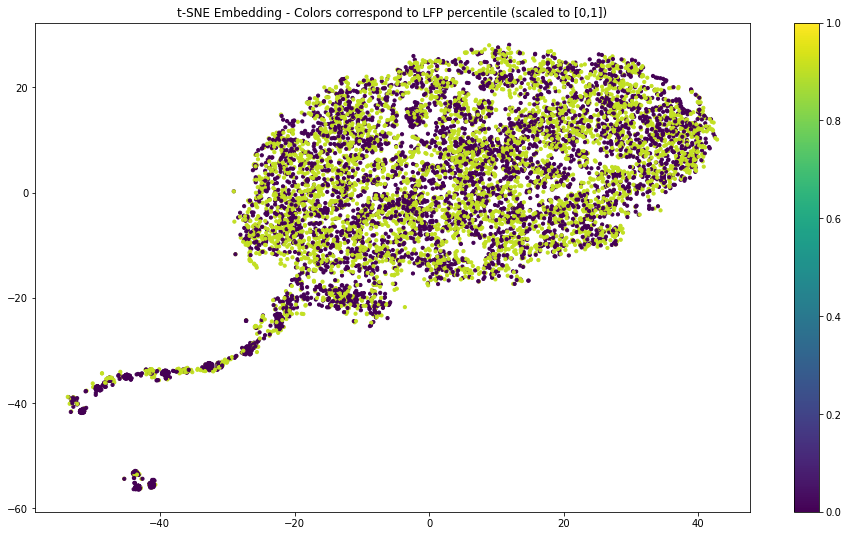

In [47]:
for t_shift in params['t_shift']:
    for plex in params['plex']:
        print(t_shift, plex)
        
        yMM = np.load(yMM_file)
        v_y = np.diff(yMM)/(1526/152.7)
        
        labels = []
        X = []
        for i in range(len(trimmed_segments)):
            s, e, sect = trimmed_segments[i]
            head_pos = yMM[s:e]
            #head_pos = head_pos - np.mean(head_pos, axis=0)
            #head_pos = scipy.stats.zscore(head_pos)
    
            if(len(head_pos) >= t_shift):
                spect = cwt_transform(head_pos, verbose=0)
                X.append(spect)
                labels += list(theta_binary[s:e])
        

        X = np.array(np.hstack(X))
        print(X.shape)
        print(len(labels))
        assert X.shape[1] == len(labels)

        X_embedded = TSNE(n_components=2, perplexity=150, verbose = 1, n_iter = 1000, n_jobs = -1, learning_rate=200).fit_transform(X.T)

        plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 10, color = cm.viridis(np.array(labels)/1.1))
        plt.title('t-SNE Embedding - Colors correspond to LFP percentile (scaled to [0,1])')
        plt.colorbar()
        plt.show()

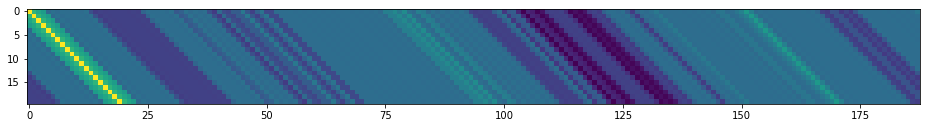

In [18]:
plt.imshow(toeplitz)

In [26]:
spect[0].shape

(5, 188)

(100, 188)

6 30
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8605 samples in 0.017s...
[t-SNE] Computed neighbors for 8605 samples in 0.495s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8605
[t-SNE] Computed conditional probabilities for sample 2000 / 8605
[t-SNE] Computed conditional probabilities for sample 3000 / 8605
[t-SNE] Computed conditional probabilities for sample 4000 / 8605
[t-SNE] Computed conditional probabilities for sample 5000 / 8605
[t-SNE] Computed conditional probabilities for sample 6000 / 8605
[t-SNE] Computed conditional probabilities for sample 7000 / 8605
[t-SNE] Computed conditional probabilities for sample 8000 / 8605
[t-SNE] Computed conditional probabilities for sample 8605 / 8605
[t-SNE] Mean sigma: 0.078237
[t-SNE] KL divergence after 250 iterations with early exaggeration: 93.311218
[t-SNE] KL divergence after 1000 iterations: 2.242394


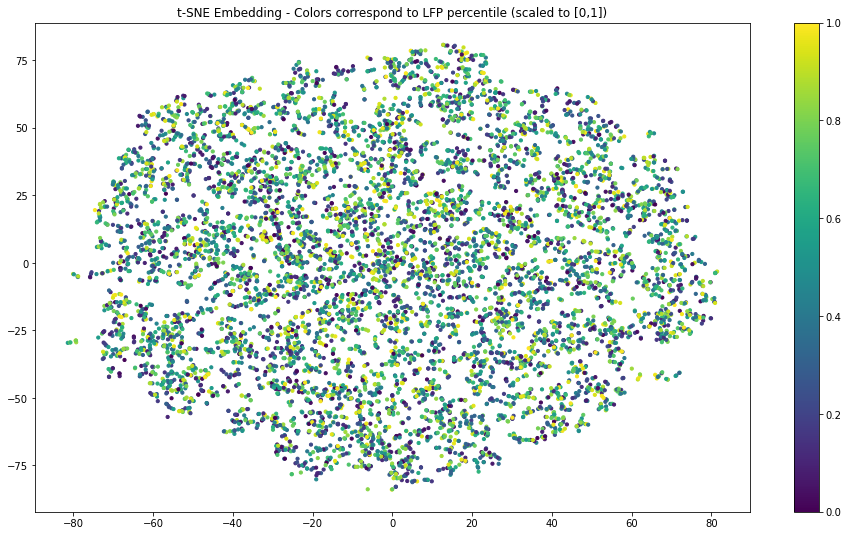

6 50
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 8605 samples in 0.017s...
[t-SNE] Computed neighbors for 8605 samples in 0.637s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8605
[t-SNE] Computed conditional probabilities for sample 2000 / 8605
[t-SNE] Computed conditional probabilities for sample 3000 / 8605
[t-SNE] Computed conditional probabilities for sample 4000 / 8605
[t-SNE] Computed conditional probabilities for sample 5000 / 8605
[t-SNE] Computed conditional probabilities for sample 6000 / 8605
[t-SNE] Computed conditional probabilities for sample 7000 / 8605
[t-SNE] Computed conditional probabilities for sample 8000 / 8605
[t-SNE] Computed conditional probabilities for sample 8605 / 8605
[t-SNE] Mean sigma: 0.089484
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.431763
[t-SNE] KL divergence after 1000 iterations: 2.214810


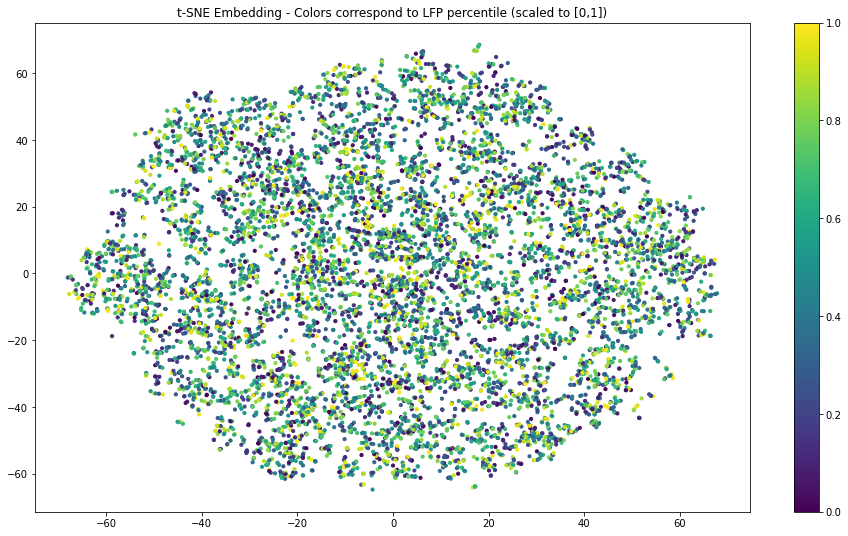

6 100
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 8605 samples in 0.017s...
[t-SNE] Computed neighbors for 8605 samples in 0.700s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8605
[t-SNE] Computed conditional probabilities for sample 2000 / 8605
[t-SNE] Computed conditional probabilities for sample 3000 / 8605
[t-SNE] Computed conditional probabilities for sample 4000 / 8605
[t-SNE] Computed conditional probabilities for sample 5000 / 8605
[t-SNE] Computed conditional probabilities for sample 6000 / 8605
[t-SNE] Computed conditional probabilities for sample 7000 / 8605
[t-SNE] Computed conditional probabilities for sample 8000 / 8605
[t-SNE] Computed conditional probabilities for sample 8605 / 8605
[t-SNE] Mean sigma: 0.105164
[t-SNE] KL divergence after 50 iterations with early exaggeration: 80.686768
[t-SNE] KL divergence after 1000 iterations: 2.092725


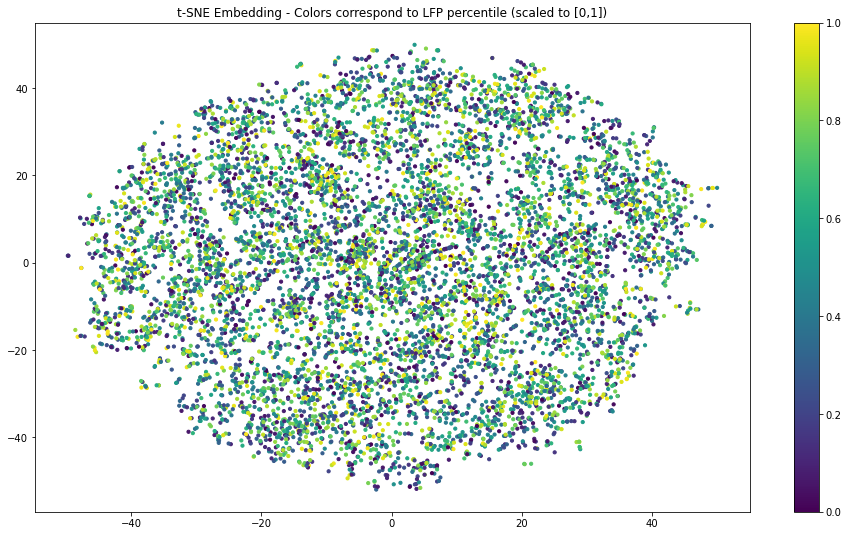

6 200
[t-SNE] Computing 601 nearest neighbors...
[t-SNE] Indexed 8605 samples in 0.017s...
[t-SNE] Computed neighbors for 8605 samples in 1.312s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8605
[t-SNE] Computed conditional probabilities for sample 2000 / 8605
[t-SNE] Computed conditional probabilities for sample 3000 / 8605
[t-SNE] Computed conditional probabilities for sample 4000 / 8605
[t-SNE] Computed conditional probabilities for sample 5000 / 8605
[t-SNE] Computed conditional probabilities for sample 6000 / 8605
[t-SNE] Computed conditional probabilities for sample 7000 / 8605
[t-SNE] Computed conditional probabilities for sample 8000 / 8605
[t-SNE] Computed conditional probabilities for sample 8605 / 8605
[t-SNE] Mean sigma: 0.121994
[t-SNE] KL divergence after 50 iterations with early exaggeration: 72.158112
[t-SNE] KL divergence after 1000 iterations: 1.904320


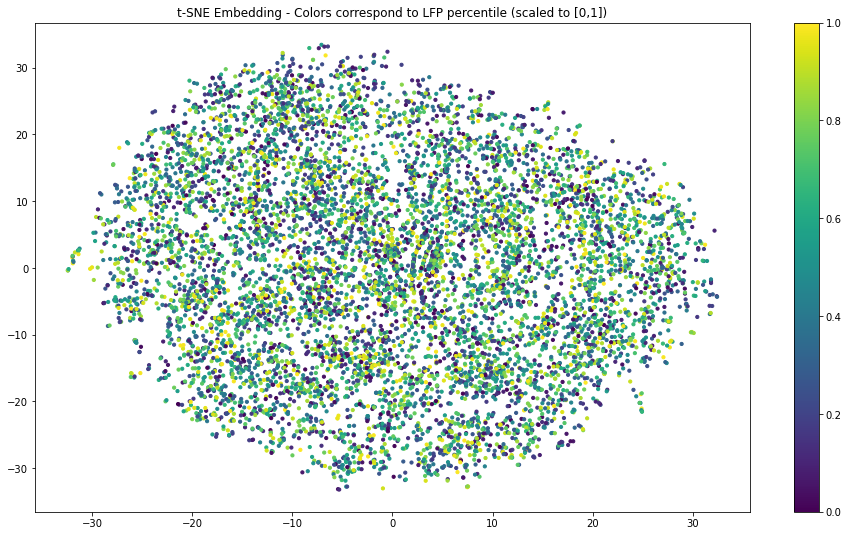

10 30
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8361 samples in 0.028s...
[t-SNE] Computed neighbors for 8361 samples in 1.102s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8361
[t-SNE] Computed conditional probabilities for sample 2000 / 8361
[t-SNE] Computed conditional probabilities for sample 3000 / 8361
[t-SNE] Computed conditional probabilities for sample 4000 / 8361
[t-SNE] Computed conditional probabilities for sample 5000 / 8361
[t-SNE] Computed conditional probabilities for sample 6000 / 8361
[t-SNE] Computed conditional probabilities for sample 7000 / 8361
[t-SNE] Computed conditional probabilities for sample 8000 / 8361
[t-SNE] Computed conditional probabilities for sample 8361 / 8361
[t-SNE] Mean sigma: 0.132100
[t-SNE] KL divergence after 50 iterations with early exaggeration: 93.566055
[t-SNE] KL divergence after 1000 iterations: 2.910951


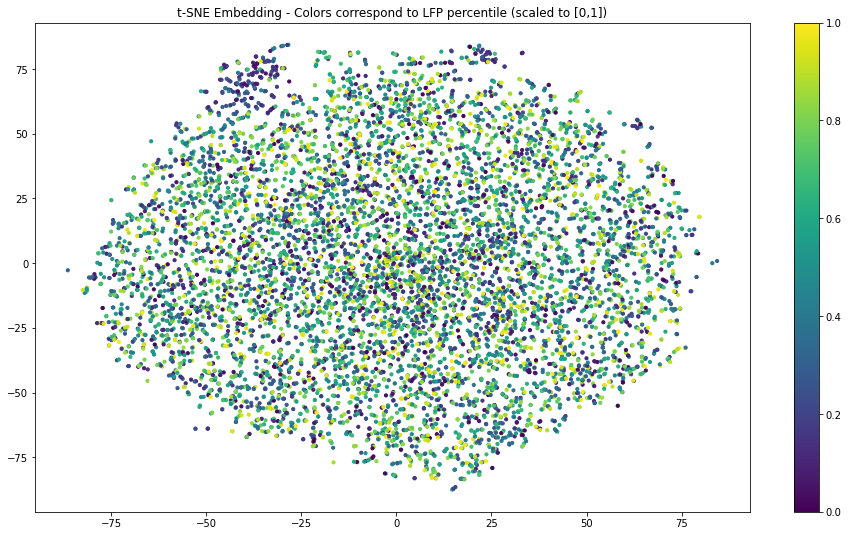

10 50
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 8361 samples in 0.032s...
[t-SNE] Computed neighbors for 8361 samples in 1.256s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8361
[t-SNE] Computed conditional probabilities for sample 2000 / 8361
[t-SNE] Computed conditional probabilities for sample 3000 / 8361
[t-SNE] Computed conditional probabilities for sample 4000 / 8361
[t-SNE] Computed conditional probabilities for sample 5000 / 8361
[t-SNE] Computed conditional probabilities for sample 6000 / 8361
[t-SNE] Computed conditional probabilities for sample 7000 / 8361
[t-SNE] Computed conditional probabilities for sample 8000 / 8361
[t-SNE] Computed conditional probabilities for sample 8361 / 8361
[t-SNE] Mean sigma: 0.143734
[t-SNE] KL divergence after 50 iterations with early exaggeration: 87.389709
[t-SNE] KL divergence after 1000 iterations: 2.866023


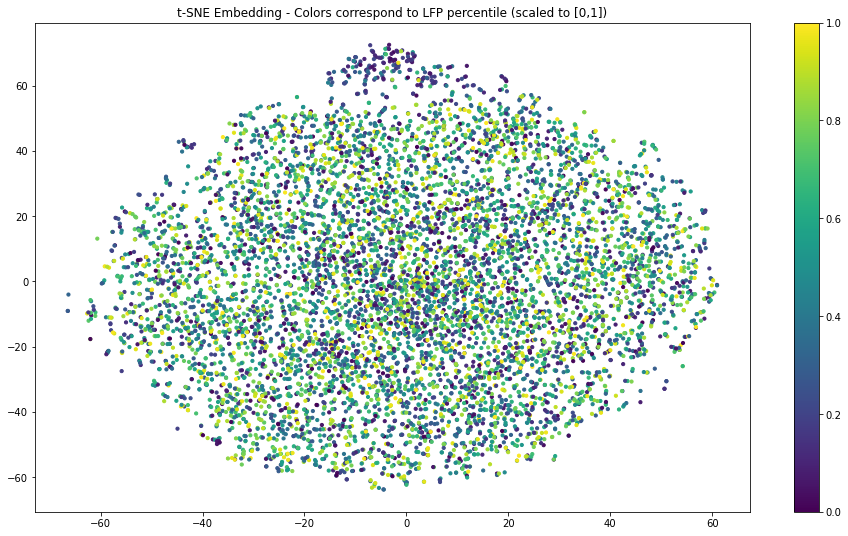

10 100
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 8361 samples in 0.036s...
[t-SNE] Computed neighbors for 8361 samples in 1.344s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8361
[t-SNE] Computed conditional probabilities for sample 2000 / 8361
[t-SNE] Computed conditional probabilities for sample 3000 / 8361
[t-SNE] Computed conditional probabilities for sample 4000 / 8361
[t-SNE] Computed conditional probabilities for sample 5000 / 8361
[t-SNE] Computed conditional probabilities for sample 6000 / 8361
[t-SNE] Computed conditional probabilities for sample 7000 / 8361
[t-SNE] Computed conditional probabilities for sample 8000 / 8361
[t-SNE] Computed conditional probabilities for sample 8361 / 8361
[t-SNE] Mean sigma: 0.159789
[t-SNE] KL divergence after 50 iterations with early exaggeration: 79.001808
[t-SNE] KL divergence after 1000 iterations: 2.672028


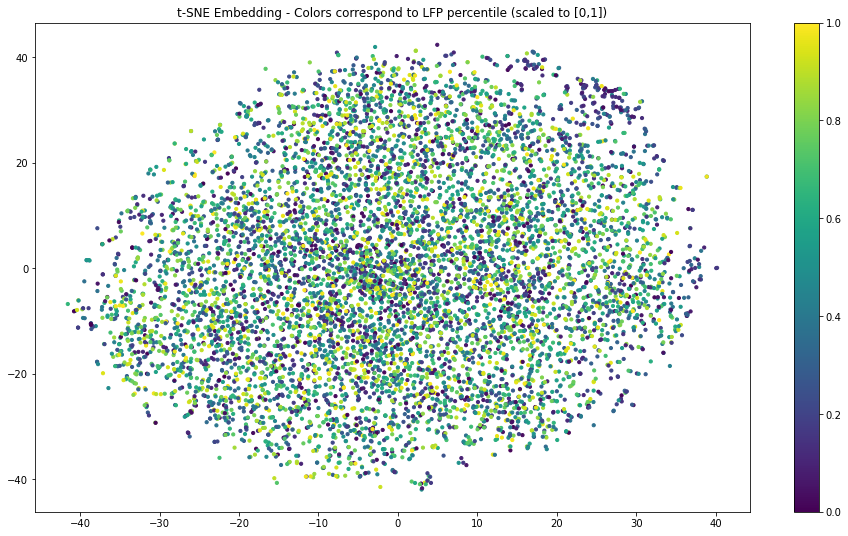

10 200
[t-SNE] Computing 601 nearest neighbors...
[t-SNE] Indexed 8361 samples in 0.030s...
[t-SNE] Computed neighbors for 8361 samples in 1.607s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8361
[t-SNE] Computed conditional probabilities for sample 2000 / 8361
[t-SNE] Computed conditional probabilities for sample 3000 / 8361
[t-SNE] Computed conditional probabilities for sample 4000 / 8361
[t-SNE] Computed conditional probabilities for sample 5000 / 8361
[t-SNE] Computed conditional probabilities for sample 6000 / 8361
[t-SNE] Computed conditional probabilities for sample 7000 / 8361
[t-SNE] Computed conditional probabilities for sample 8000 / 8361
[t-SNE] Computed conditional probabilities for sample 8361 / 8361
[t-SNE] Mean sigma: 0.177051
[t-SNE] KL divergence after 50 iterations with early exaggeration: 70.641708
[t-SNE] KL divergence after 1000 iterations: 2.317937


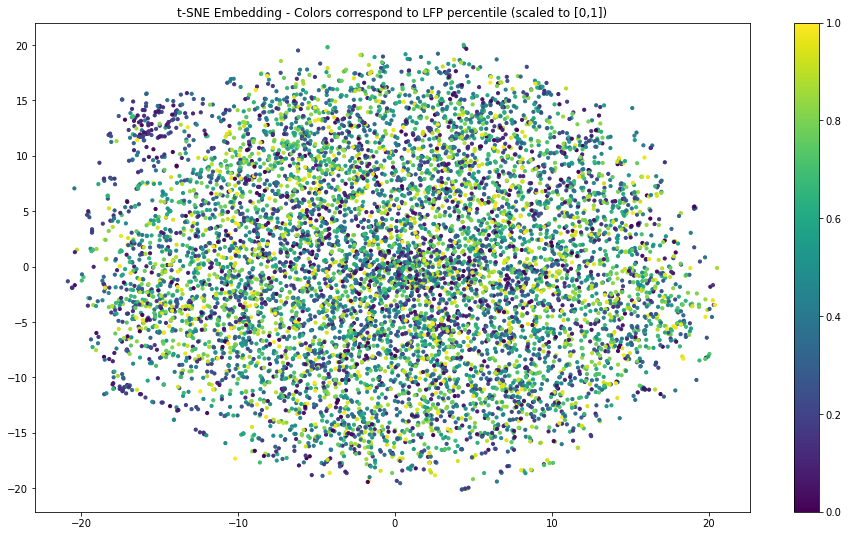

20 30
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 7790 samples in 0.056s...
[t-SNE] Computed neighbors for 7790 samples in 1.435s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7790
[t-SNE] Computed conditional probabilities for sample 2000 / 7790
[t-SNE] Computed conditional probabilities for sample 3000 / 7790
[t-SNE] Computed conditional probabilities for sample 4000 / 7790
[t-SNE] Computed conditional probabilities for sample 5000 / 7790
[t-SNE] Computed conditional probabilities for sample 6000 / 7790
[t-SNE] Computed conditional probabilities for sample 7000 / 7790
[t-SNE] Computed conditional probabilities for sample 7790 / 7790
[t-SNE] Mean sigma: 0.209926
[t-SNE] KL divergence after 50 iterations with early exaggeration: 90.865456
[t-SNE] KL divergence after 1000 iterations: 3.488840


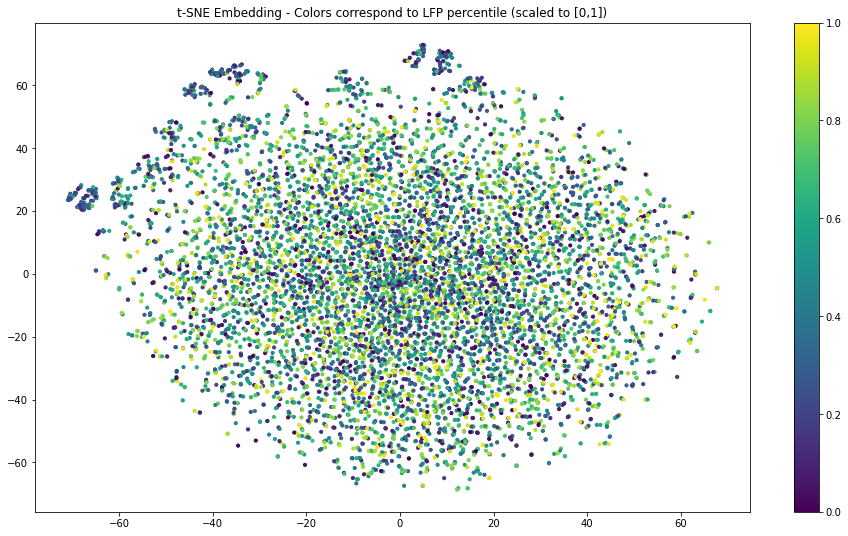

20 50
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 7790 samples in 0.056s...
[t-SNE] Computed neighbors for 7790 samples in 1.576s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7790
[t-SNE] Computed conditional probabilities for sample 2000 / 7790
[t-SNE] Computed conditional probabilities for sample 3000 / 7790
[t-SNE] Computed conditional probabilities for sample 4000 / 7790
[t-SNE] Computed conditional probabilities for sample 5000 / 7790
[t-SNE] Computed conditional probabilities for sample 6000 / 7790
[t-SNE] Computed conditional probabilities for sample 7000 / 7790
[t-SNE] Computed conditional probabilities for sample 7790 / 7790
[t-SNE] Mean sigma: 0.224196
[t-SNE] KL divergence after 50 iterations with early exaggeration: 84.760017
[t-SNE] KL divergence after 1000 iterations: 3.303847


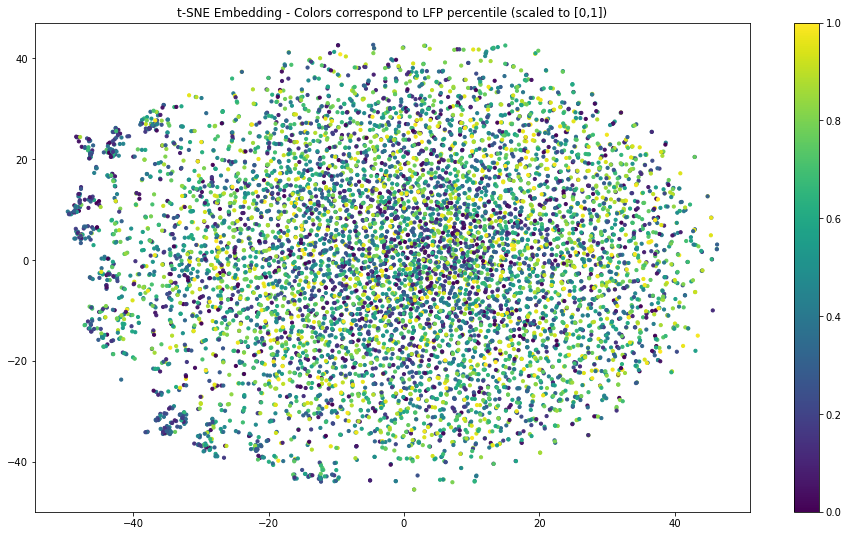

20 100
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 7790 samples in 0.057s...
[t-SNE] Computed neighbors for 7790 samples in 1.563s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7790
[t-SNE] Computed conditional probabilities for sample 2000 / 7790
[t-SNE] Computed conditional probabilities for sample 3000 / 7790
[t-SNE] Computed conditional probabilities for sample 4000 / 7790
[t-SNE] Computed conditional probabilities for sample 5000 / 7790
[t-SNE] Computed conditional probabilities for sample 6000 / 7790
[t-SNE] Computed conditional probabilities for sample 7000 / 7790
[t-SNE] Computed conditional probabilities for sample 7790 / 7790
[t-SNE] Mean sigma: 0.243478
[t-SNE] KL divergence after 100 iterations with early exaggeration: 76.501671
[t-SNE] KL divergence after 1000 iterations: 3.036390


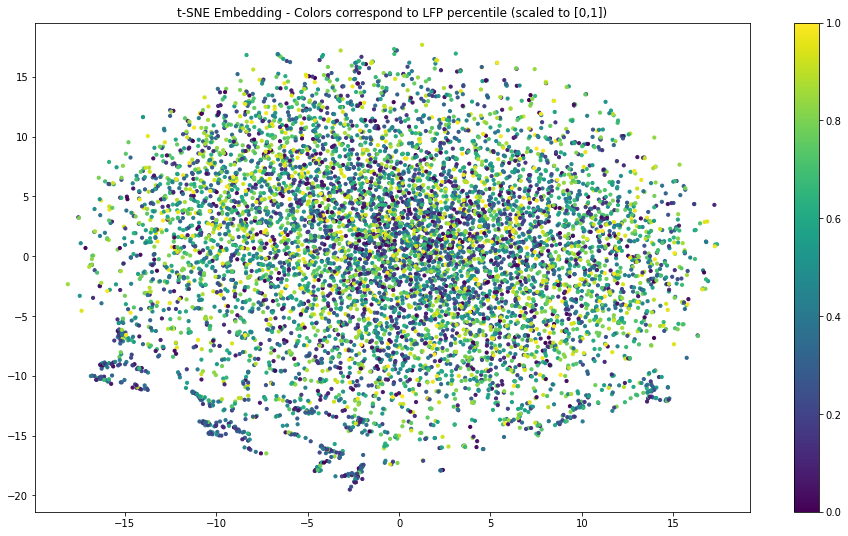

20 200
[t-SNE] Computing 601 nearest neighbors...
[t-SNE] Indexed 7790 samples in 0.049s...
[t-SNE] Computed neighbors for 7790 samples in 1.955s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7790
[t-SNE] Computed conditional probabilities for sample 2000 / 7790
[t-SNE] Computed conditional probabilities for sample 3000 / 7790
[t-SNE] Computed conditional probabilities for sample 4000 / 7790
[t-SNE] Computed conditional probabilities for sample 5000 / 7790
[t-SNE] Computed conditional probabilities for sample 6000 / 7790
[t-SNE] Computed conditional probabilities for sample 7000 / 7790
[t-SNE] Computed conditional probabilities for sample 7790 / 7790
[t-SNE] Mean sigma: 0.264556
[t-SNE] KL divergence after 100 iterations with early exaggeration: 68.319679
[t-SNE] KL divergence after 1000 iterations: 2.494620


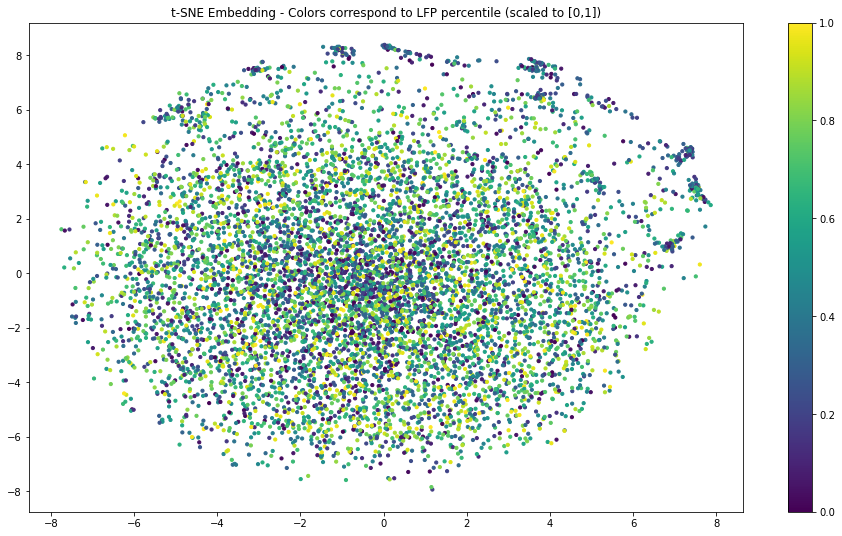

50 30
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6280 samples in 0.103s...
[t-SNE] Computed neighbors for 6280 samples in 1.416s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6280
[t-SNE] Computed conditional probabilities for sample 2000 / 6280
[t-SNE] Computed conditional probabilities for sample 3000 / 6280
[t-SNE] Computed conditional probabilities for sample 4000 / 6280
[t-SNE] Computed conditional probabilities for sample 5000 / 6280
[t-SNE] Computed conditional probabilities for sample 6000 / 6280
[t-SNE] Computed conditional probabilities for sample 6280 / 6280
[t-SNE] Mean sigma: 0.405063
[t-SNE] KL divergence after 250 iterations with early exaggeration: 90.983559
[t-SNE] KL divergence after 1000 iterations: 3.173511


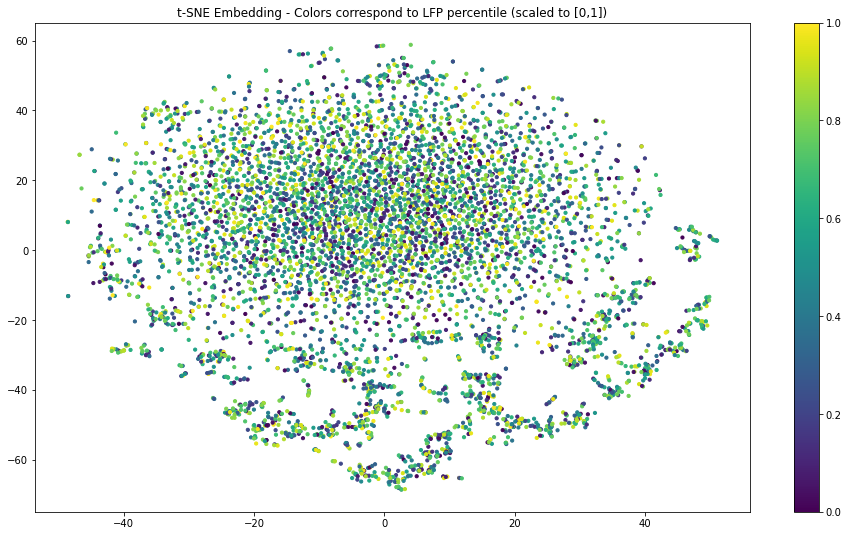

50 50
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 6280 samples in 0.101s...
[t-SNE] Computed neighbors for 6280 samples in 1.435s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6280
[t-SNE] Computed conditional probabilities for sample 2000 / 6280
[t-SNE] Computed conditional probabilities for sample 3000 / 6280
[t-SNE] Computed conditional probabilities for sample 4000 / 6280
[t-SNE] Computed conditional probabilities for sample 5000 / 6280
[t-SNE] Computed conditional probabilities for sample 6000 / 6280
[t-SNE] Computed conditional probabilities for sample 6280 / 6280
[t-SNE] Mean sigma: 0.433840
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.909760
[t-SNE] KL divergence after 1000 iterations: 3.020018


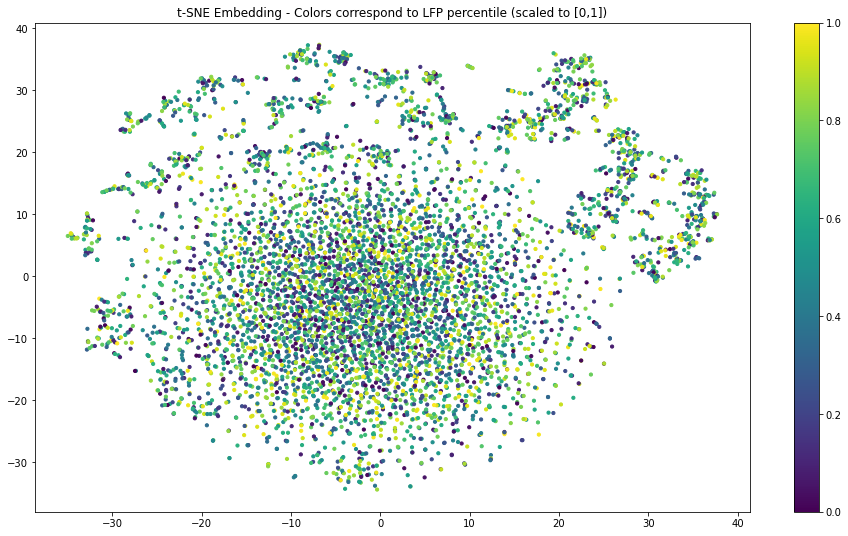

50 100
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 6280 samples in 0.108s...
[t-SNE] Computed neighbors for 6280 samples in 1.435s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6280
[t-SNE] Computed conditional probabilities for sample 2000 / 6280
[t-SNE] Computed conditional probabilities for sample 3000 / 6280
[t-SNE] Computed conditional probabilities for sample 4000 / 6280
[t-SNE] Computed conditional probabilities for sample 5000 / 6280
[t-SNE] Computed conditional probabilities for sample 6000 / 6280
[t-SNE] Computed conditional probabilities for sample 6280 / 6280
[t-SNE] Mean sigma: 0.473575
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.873322
[t-SNE] KL divergence after 1000 iterations: 2.704323


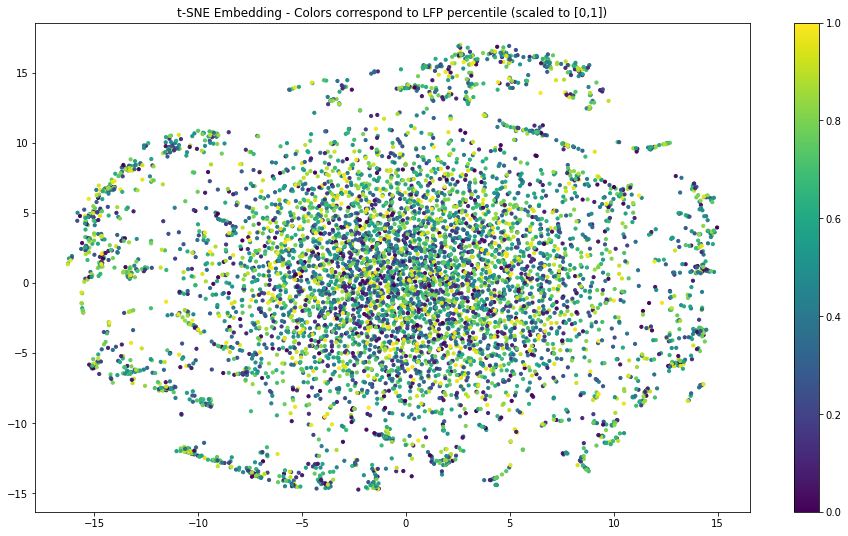

50 200
[t-SNE] Computing 601 nearest neighbors...
[t-SNE] Indexed 6280 samples in 0.113s...
[t-SNE] Computed neighbors for 6280 samples in 1.670s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6280
[t-SNE] Computed conditional probabilities for sample 2000 / 6280
[t-SNE] Computed conditional probabilities for sample 3000 / 6280
[t-SNE] Computed conditional probabilities for sample 4000 / 6280
[t-SNE] Computed conditional probabilities for sample 5000 / 6280
[t-SNE] Computed conditional probabilities for sample 6000 / 6280
[t-SNE] Computed conditional probabilities for sample 6280 / 6280
[t-SNE] Mean sigma: 0.517385
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.907036
[t-SNE] KL divergence after 1000 iterations: 2.229273


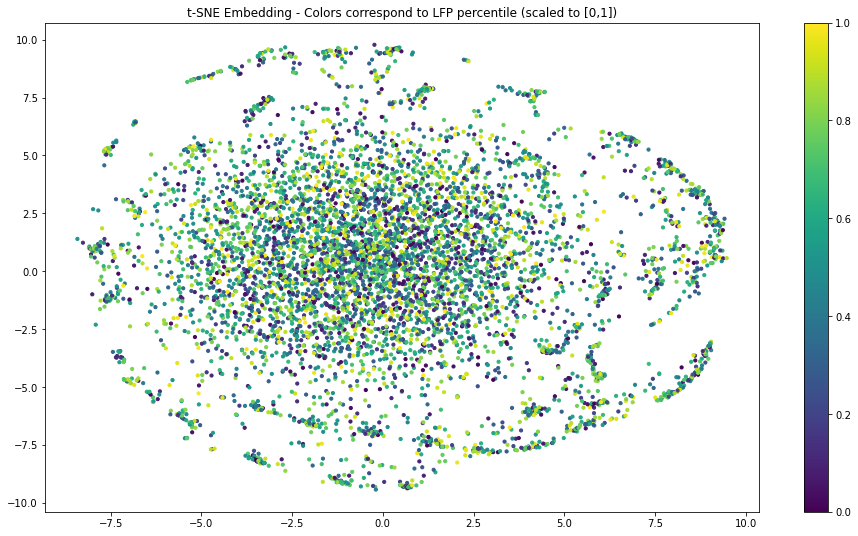

In [186]:
for t_shift in params['t_shift']:
    for plex in params['plex']:
        print(t_shift, plex)
        
        yMM = np.load(yMM_file)
        v_y = np.diff(yMM)/(1526/152.7)
        head_vel = scipy.stats.zscore(v_y)
        head_pos = scipy.stats.zscore(yMM)
        
        toeplitz_pos = scipy.linalg.toeplitz(head_pos[:t_shift], head_pos)
        toeplitz_vel = scipy.linalg.toeplitz(head_vel[:t_shift], head_vel)
        
        toeplitz = np.vstack([toeplitz_pos[:,:-1], toeplitz_vel])
        
        labels = []
        X = []
        for i in range(len(trimmed_segments)):
            s, e, sect = trimmed_segments[i]

            labels += list(data_percentile[s+t_shift//2:e-t_shift//2])
            X.append(toeplitz[:, s: e-t_shift])
        
        X = np.array(np.hstack(X))
        

        X_embedded = TSNE(n_components=2, perplexity=plex, verbose = 1, n_iter = 1000, n_jobs = -1, learning_rate=200).fit_transform(X.T)

        plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 10, color = cm.viridis(np.array(labels)/100))
        plt.title('t-SNE Embedding - Colors correspond to LFP percentile (scaled to [0,1])')
        plt.colorbar()
        plt.show()

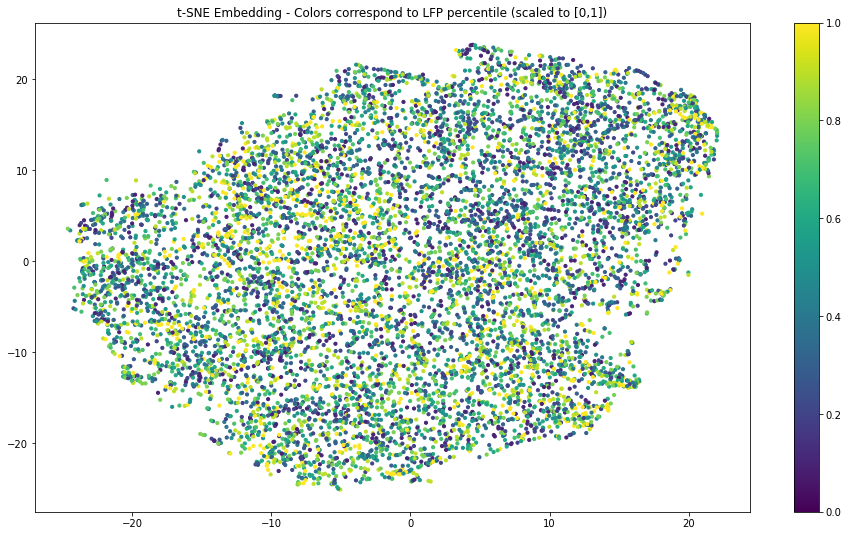

In [118]:
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 10, color = cm.viridis(labels/10))
plt.title('t-SNE Embedding - Colors correspond to LFP percentile (scaled to [0,1])')
plt.colorbar()
plt.show()

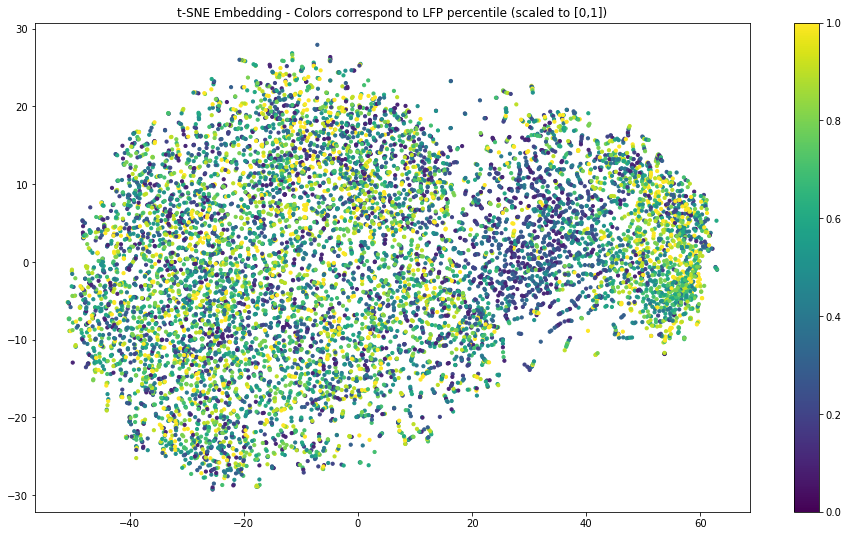

In [207]:
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 10, color = cm.viridis(labels/10))
plt.title('t-SNE Embedding - Colors correspond to LFP percentile (scaled to [0,1])')
plt.colorbar()
plt.show()

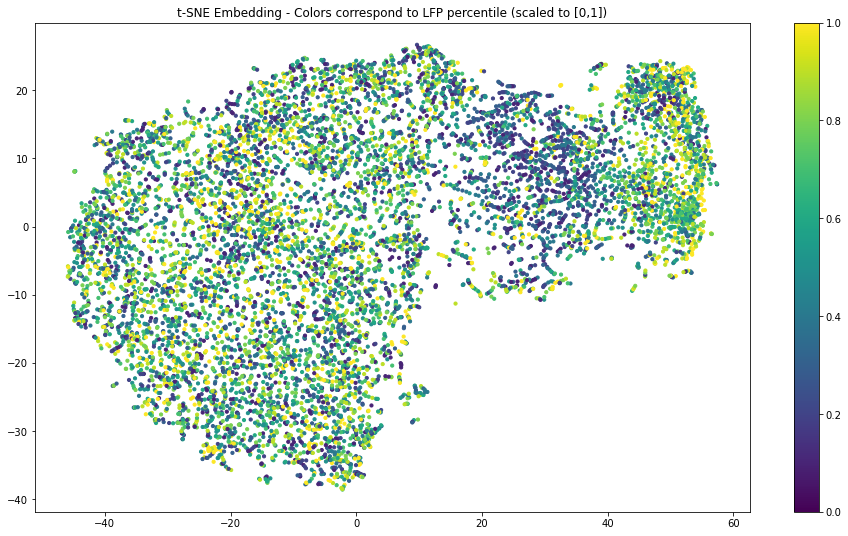

In [199]:
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 10, color = cm.viridis(labels/10))
plt.title('t-SNE Embedding - Colors correspond to LFP percentile (scaled to [0,1])')
plt.colorbar()
plt.show()

In [ ]:
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 10, color = cm.viridis(labels/10))
plt.title('t-SNE Embedding - Colors correspond to LFP percentile (scaled to [0,1])')
plt.colorbar()
plt.show()

In [175]:
print(X_embedded[:,0].shape)

(9972,)


In [68]:
def filter_embedding(embedding, labels, target_label):
    y = (labels == target_label)*1
    class_embedding = X_embedded[y==1]
    
    assert np.sum(y) == len(class_embedding)
    
    
    # Embedding
    fig, axs = plt.subplots(1, 2, constrained_layout = True)
    axs[0].scatter(class_embedding[:, 0], class_embedding[:, 1], s= 10)
    axs[0].set_title('t-SNE Embedding of {} Theta Power Percentile'.format(target_label*10))
    
    # Kernel Density Estimation
    kde = KernelDensity(kernel='gaussian', bandwidth=2.5).fit(class_embedding)

    xmin = np.min(X_embedded[:,0])
    xmax = np.max(X_embedded[:,0])
    ymin = np.min(X_embedded[:,1])
    ymax = np.max(X_embedded[:,1])
    x = np.linspace(xmin, xmax, 100)
    y = np.linspace(ymin, ymax, 100)
    xx, yy  = np.meshgrid(x, y)

    grid = np.c_[np.ravel(xx), np.ravel(yy)]

    z = np.exp(kde.score_samples(grid))
    z = z.reshape(xx.shape)
    
    axs[1].contourf(xx, yy, z, aspect='auto', cmap='magma')
    axs[1].set_title("Gaussian Kernel Density Estimation")
    
    plt.savefig('data/results/week_9/class_embedding_{}_percentile.png'.format(target_label*10))
    plt.show()

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: UserWarning: The following kwargs were not used by contour: 'aspect'


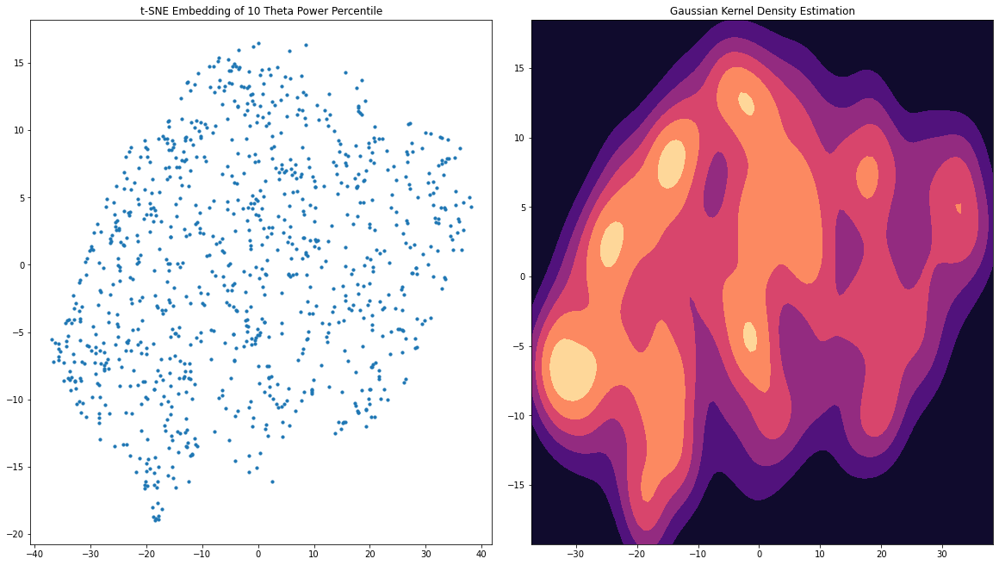

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: UserWarning: The following kwargs were not used by contour: 'aspect'


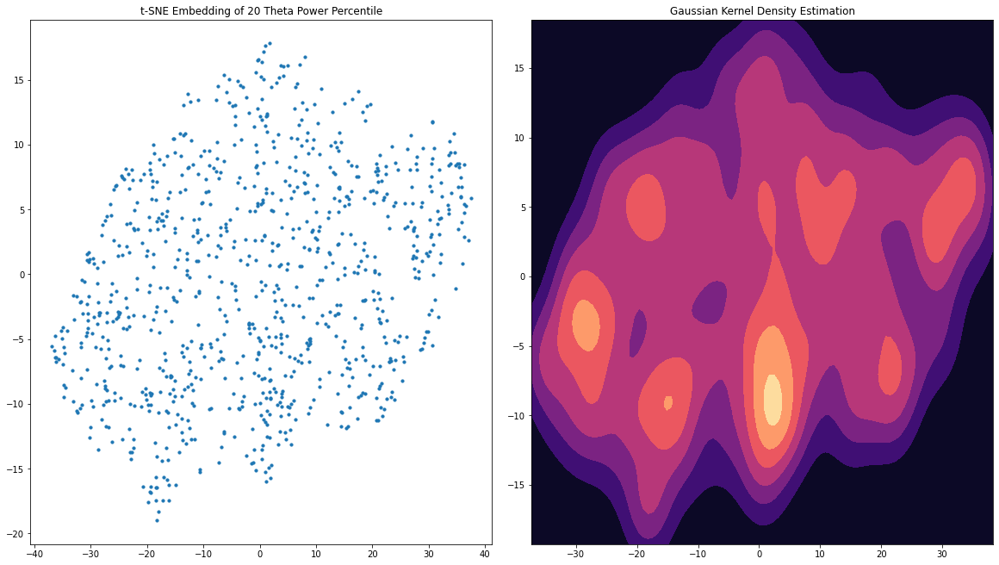

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: UserWarning: The following kwargs were not used by contour: 'aspect'


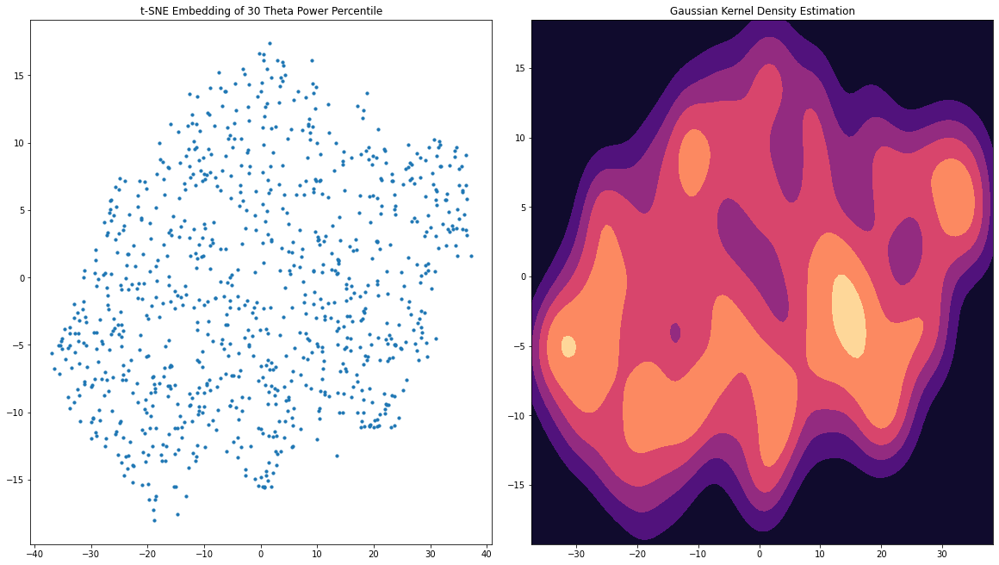

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: UserWarning: The following kwargs were not used by contour: 'aspect'


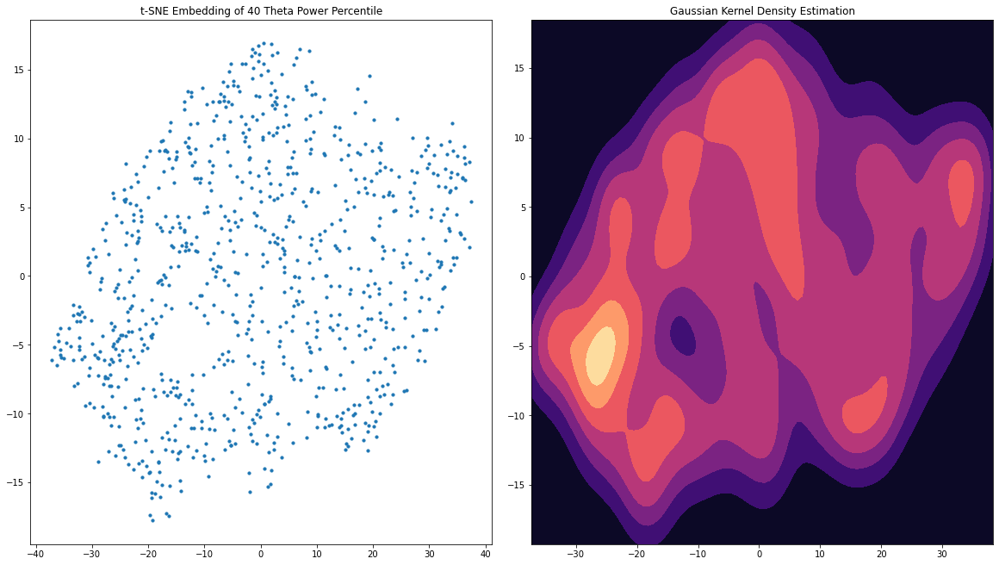

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: UserWarning: The following kwargs were not used by contour: 'aspect'


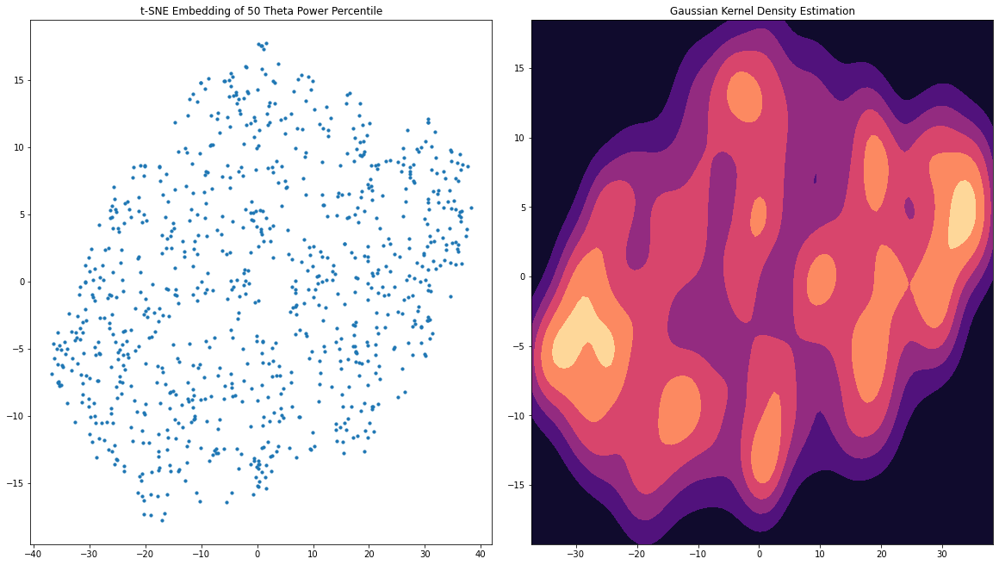

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: UserWarning: The following kwargs were not used by contour: 'aspect'


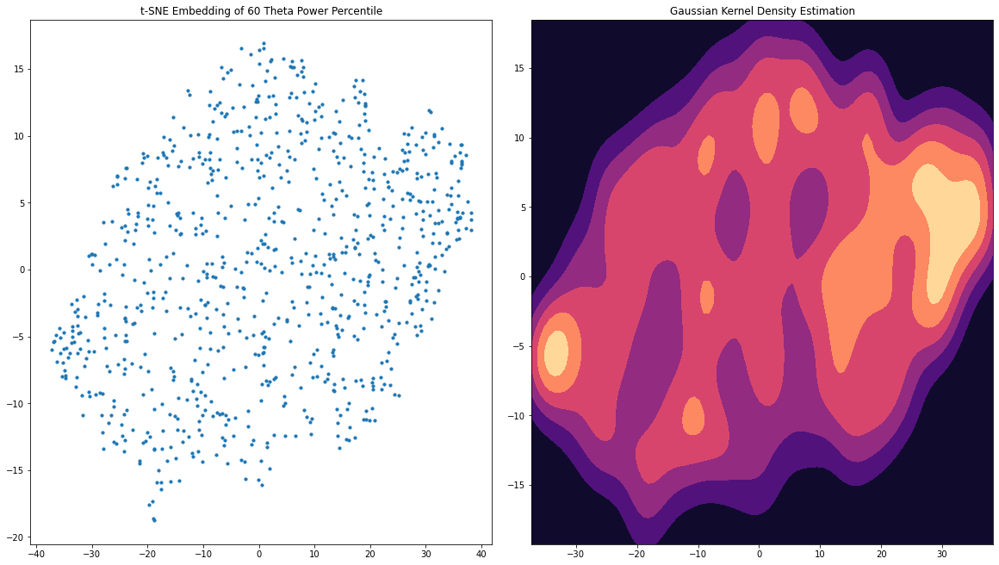

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: UserWarning: The following kwargs were not used by contour: 'aspect'


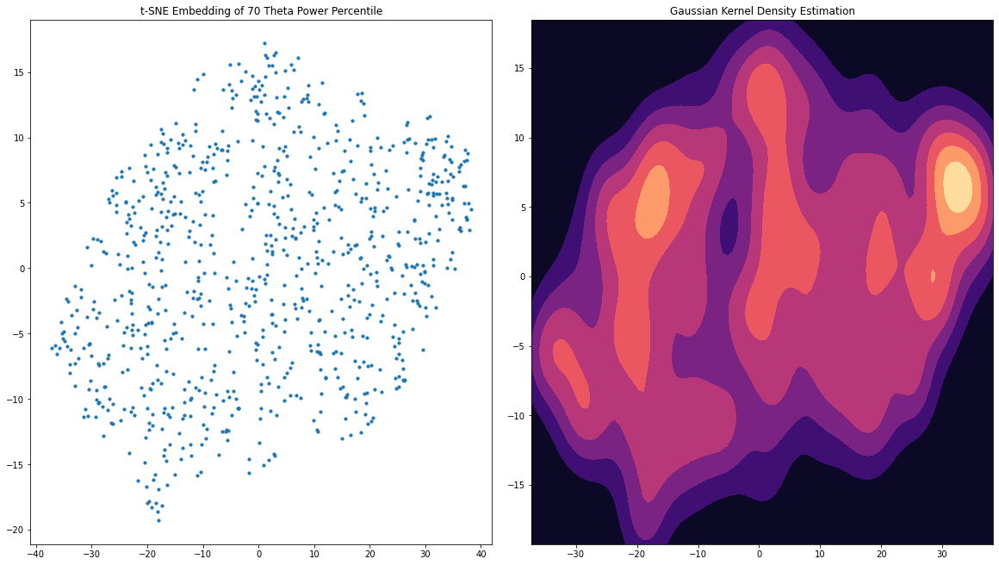

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: UserWarning: The following kwargs were not used by contour: 'aspect'


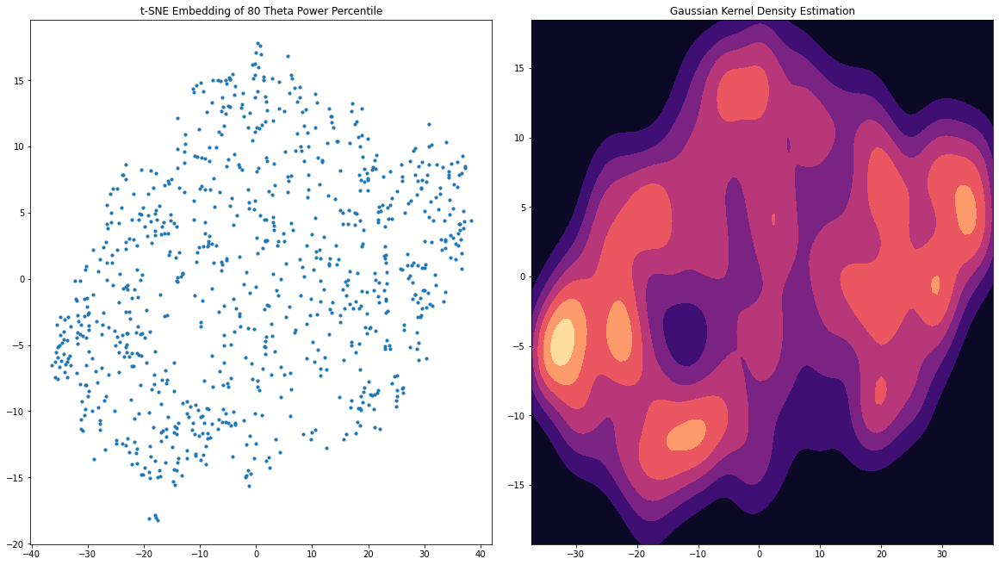

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: UserWarning: The following kwargs were not used by contour: 'aspect'


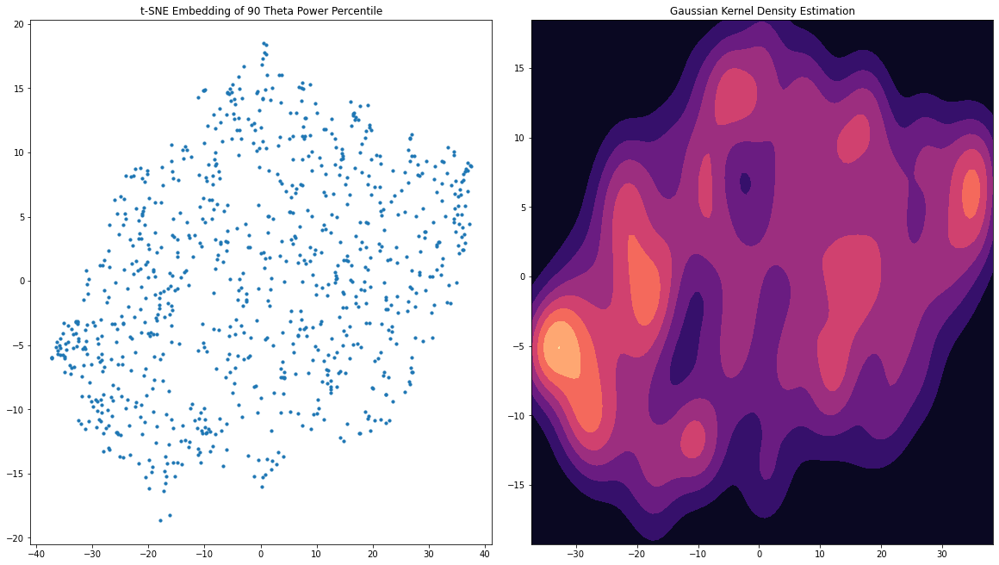

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: UserWarning: The following kwargs were not used by contour: 'aspect'


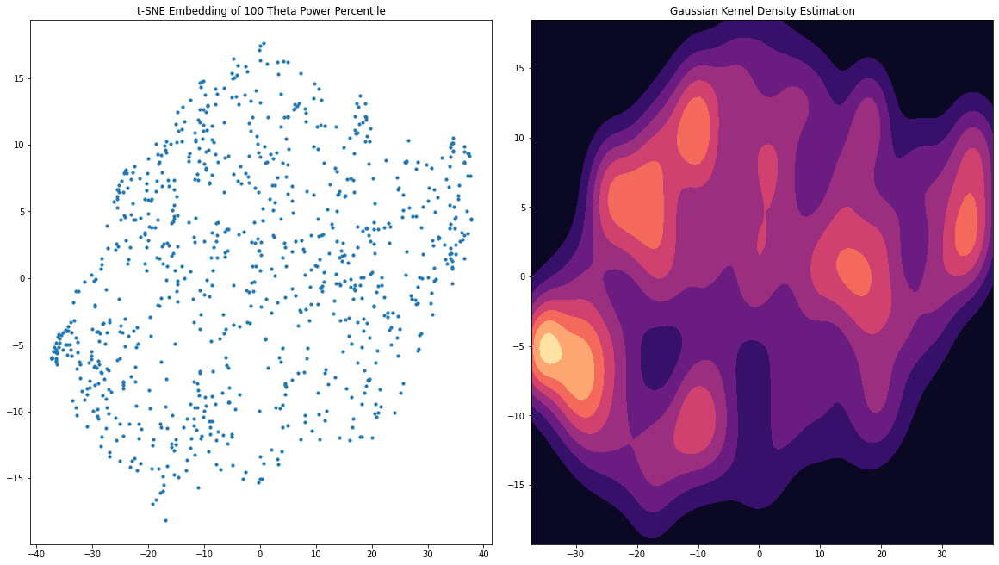

In [106]:
for i in range(1,11):
    filter_embedding(X_embedded, labels, i)

# Gaussian Kernel Density Estimation

In [95]:
xmin = np.min(X_embedded[:,0])
xmax = np.max(X_embedded[:,0])
ymin = np.min(X_embedded[:,1])
ymax = np.max(X_embedded[:,1])

In [96]:
xmin, xmax, ymin, ymax

(-37.317577, 38.35368, -19.28156, 18.485477)

In [97]:
X_embedded.shape

(8971, 2)

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:14: UserWarning: The following kwargs were not used by contour: 'aspect'
  


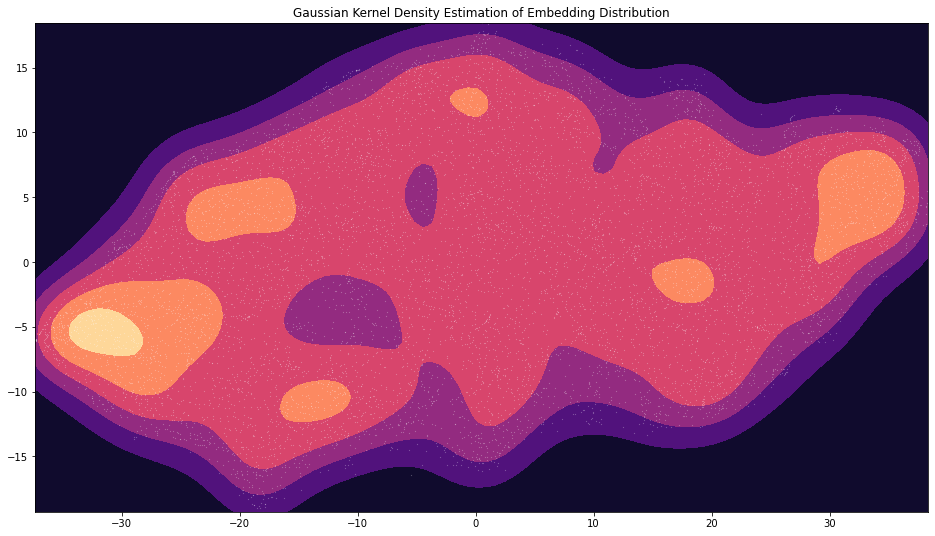

In [98]:
from sklearn.neighbors import KernelDensity

kde = KernelDensity(kernel='gaussian', bandwidth=2.5).fit(X_embedded)

x = np.linspace(xmin, xmax, 100)
y = np.linspace(ymin, ymax, 100)
xx, yy  = np.meshgrid(x, y)

grid = np.c_[np.ravel(xx), np.ravel(yy)]

z = np.exp(kde.score_samples(grid))
z = z.reshape(xx.shape)

plt.contourf(xx, yy, z, aspect='auto', cmap='magma')
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s=0.01, color='white')
plt.title("Gaussian Kernel Density Estimation of Embedding Distribution")
plt.show()

# Watershed

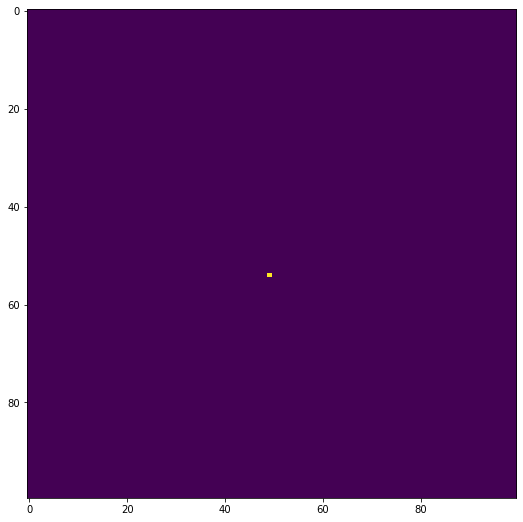

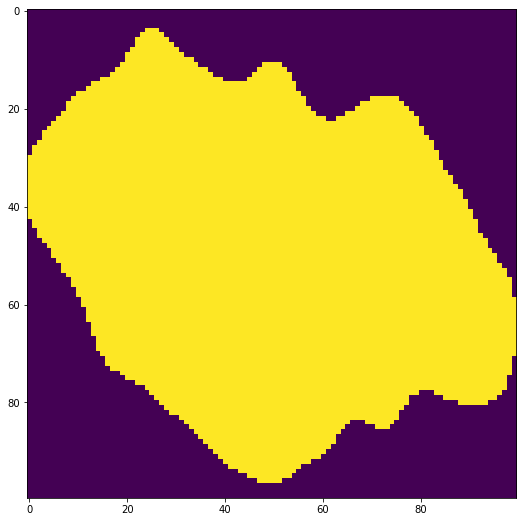

In [99]:
z_scaled = 255*z / np.max(z)
z_scaled = z_scaled.astype(np.uint8)

thresh = cv2.threshold(z_scaled, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

distance_map = scipy.ndimage.distance_transform_edt(thresh)

local_max = skimage.feature.peak_local_max(distance_map, indices=False, min_distance=2, labels=thresh)
plt.imshow(local_max)
plt.show()

markers = scipy.ndimage.label(local_max, structure=np.ones((3, 3)))[0]

from skimage.segmentation import watershed
regions = watershed(-distance_map, markers, mask=thresh)
plt.imshow(regions)
plt.show()

In [100]:
np.unique(regions)

array([0, 1])

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:1: UserWarning: The following kwargs were not used by contour: 'aspect'
  """Entry point for launching an IPython kernel.


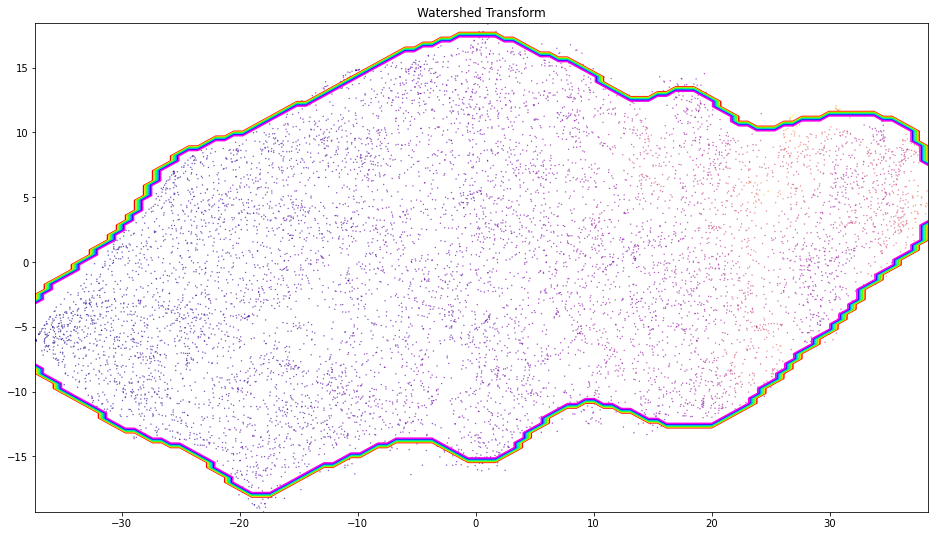

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:5: UserWarning: The following kwargs were not used by contour: 'aspect'
  """


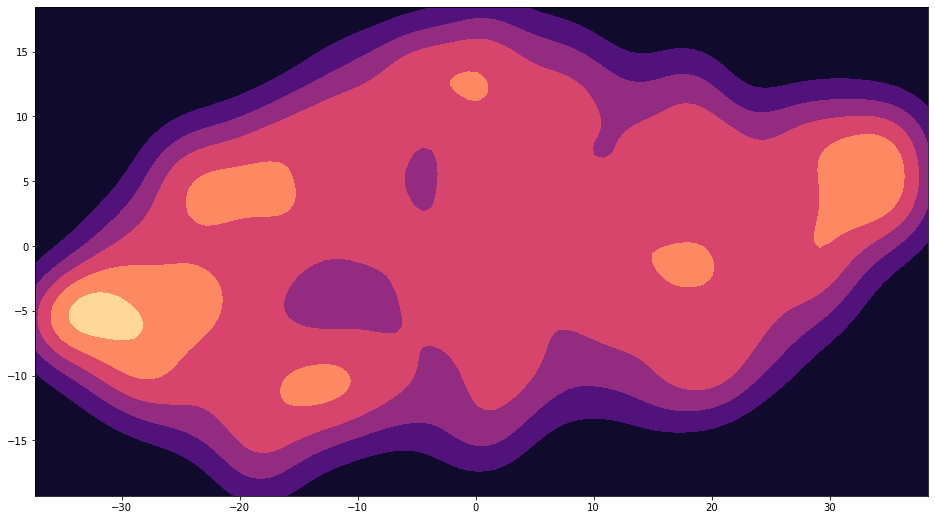

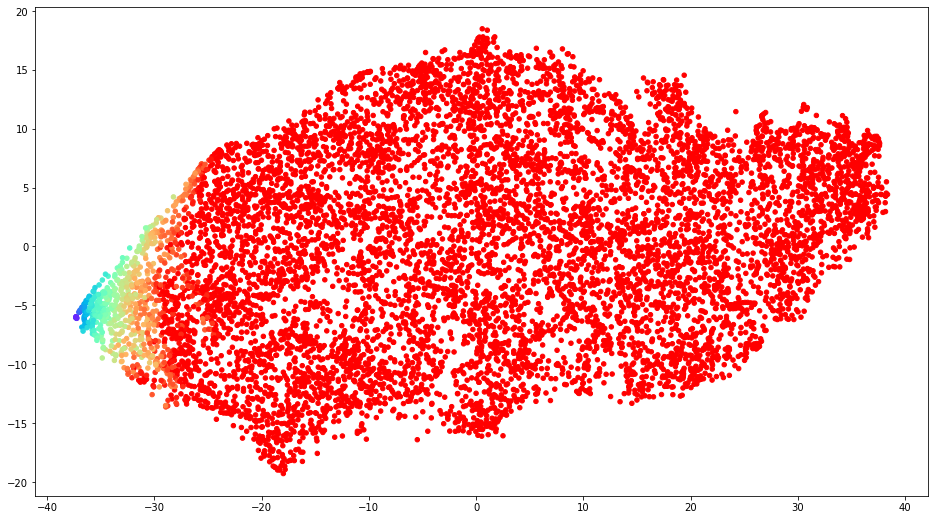

In [101]:
plt.contour(xx, yy, regions, aspect='auto', cmap = 'hsv')
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s=0.1, color = cm.plasma(norm_factor/np.max(norm_factor)))
plt.title("Watershed Transform")
plt.show()
plt.contourf(xx, yy, z, aspect='auto', cmap='magma')
plt.show()
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s=20, color = cm.rainbow(norm_factor))
plt.show()

In [102]:
labels

array([ 3,  3,  4, ..., 10,  2,  2], dtype=int64)

In [103]:
from matplotlib.backends.backend_agg import FigureCanvasAgg

trial_indices = np.cumsum([0] + [seg[1] - seg[0] for seg in segments])
i = 1
s, e = trial_indices[i], trial_indices[i+1]
print(segments[i])
print(s, e)

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('data/results/week_9/sample.avi',fourcc, 3, (2640, 2800))

for j in range(e-s):
    fig = plt.Figure(figsize=(16, 9), dpi=200)
    canvas = FigureCanvasAgg(fig)
    
    ax = fig.gca()
    
    #print(X_embedded[s:e, 0][j])
    im = ax.scatter(X_embedded[s:e, 0][j], X_embedded[s:e, 1][j], s= 100, color = cm.viridis(labels[s:e][j]/10))
    #ax.colorbar()
    ax.contour(xx, yy, regions, aspect='auto', cmap = 'hsv')
    ax.scatter([40]*80, np.arange(-40, 40),s=0.1, marker='o')
    ax.set_title('t-SNE Embedding of Single Trial - Colors correspond to theta percentile')
    fig.colorbar(im, ax=fig.get_axes())
    
    canvas.draw()
    string, (width, height) = canvas.print_to_buffer()
    
    plot_img = np.fromstring(string, dtype='uint8').reshape(height, width, 4)
    plot_img = cv2.cvtColor(plot_img, cv2.COLOR_BGRA2BGR)
    plot_img = plot_img[100:-100,180:-380,:] # trim empty space
    
    
    #plt.show()
    
    vid_folder = '{}_{}_{}'.format(*segments[i])
    vid_path = 'data/datasets/stationary_rat/videos/{}/{}/{}.jpg'.format(vid_folder, vid_folder, segments[i][0] + j)
    #print(vid_path)
    
    frame = cv2.imread(vid_path)
    frame = cv2.resize(frame, (220*12, 100*12))
    #print(plot_img.shape)
    #print(frame.shape)
    
    
    #plt.imshow(frame)
    #plt.show()
    #plt.imshow(plot_img)
    #plt.show()
    
    stacked = np.vstack([frame,plot_img])
    out.write(stacked)
    #plt.imshow(stacked)
    #plt.show()
    
out.release()
cv2.destroyAllWindows()

[1940 2160    9]
36 256


C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:21: UserWarning: The following kwargs were not used by contour: 'aspect'
C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\ipykernel_launcher.py:29: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


In [104]:
for i in range(len(segments)):
    print(i, segments[i])

0 [662 698   9]
1 [1940 2160    9]
2 [2604 2664    9]
3 [3378 3572    9]
4 [4382 4603    9]
5 [5131 5324    9]
6 [6030 6245    9]
7 [6593 6617    9]
8 [7583 7791    9]
9 [8598 8809    9]
10 [9371 9563    9]
11 [10369 10573     9]
12 [11386 11597     9]
13 [12445 12649     9]
14 [13195 13441     9]
15 [14106 14312     9]
16 [14827 15021     9]
17 [15745 15938     9]
18 [16526 16710     9]
19 [17606 17789     9]
20 [17875 17917     9]
21 [18830 19023     9]
22 [19705 19893     9]
23 [20678 20871     9]
24 [21698 21878     9]
25 [22414 22601     9]
26 [23467 23643     9]
27 [23653 23665     9]
28 [24282 24470     9]
29 [25259 25457     9]
30 [27014 27052     9]
31 [28531 28713     9]
32 [30095 30300     9]
33 [30851 30881     9]
34 [31828 32010     9]
35 [32066 32096     9]
36 [32693 32729     9]
37 [33452 33643     9]
38 [34208 34380     9]
39 [35103 35283     9]
40 [35937 36119     9]
41 [36810 36981     9]
42 [37506 37718     9]
43 [38348 38528     9]
44 [39393 39597     9]
45 [40065 4

In [105]:
from matplotlib.backends.backend_agg import FigureCanvasAgg

trial_indices = np.cumsum([0] + [seg[1] - seg[0] for seg in segments])
i = 59
s, e = trial_indices[i], trial_indices[i+1]
print(segments[i])
print(s, e)

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('data/results/week_9/stacked_{}_{}_{}.avi'.format(*segments[i]),fourcc, 3, (2640, 2800))

for j in range(e-s):
    fig = plt.Figure(figsize=(16, 9), dpi=200)
    canvas = FigureCanvasAgg(fig)
    
    ax = fig.gca()
    
    #print(X_embedded[s:e, 0][j])
    im = ax.scatter(X_embedded[s:e, 0][j], X_embedded[s:e, 1][j], s= 100, color = cm.viridis(labels[s:e][j]/10))
    #ax.colorbar()
    ax.contour(xx, yy, regions, aspect='auto', cmap = 'hsv')
    ax.scatter([40]*80, np.arange(-40, 40),s=0.1, marker='o')
    ax.set_title('t-SNE Embedding of Single Trial - Colors correspond to theta percentile')
    fig.colorbar(im, ax=fig.get_axes())
    
    canvas.draw()
    string, (width, height) = canvas.print_to_buffer()
    
    plot_img = np.fromstring(string, dtype='uint8').reshape(height, width, 4)
    plot_img = cv2.cvtColor(plot_img, cv2.COLOR_BGRA2BGR)
    plot_img = plot_img[100:-100,180:-380,:] # trim empty space
    
    
    #plt.show()
    
    vid_folder = '{}_{}_{}'.format(*segments[i])
    vid_path = 'data/datasets/stationary_rat/videos/{}/{}/{}.jpg'.format(vid_folder, vid_folder, segments[i][0] + j)
    #print(vid_path)
    
    frame = cv2.imread(vid_path)
    frame = cv2.resize(frame, (220*12, 100*12))
    #print(plot_img.shape)
    #print(frame.shape)
    
    
    #plt.imshow(frame)
    #plt.show()
    #plt.imshow(plot_img)
    #plt.show()
    
    stacked = np.vstack([frame,plot_img])
    out.write(stacked)
    #plt.imshow(stacked)
    #plt.show()
    
out.release()
cv2.destroyAllWindows()

[54680 54708     9]
9667 9695


IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
trial_indices = np.cumsum([seg[1] - seg[0] for seg in trimmed_segments])
for i in range(len(trial_indices)-1)[:10]:
    print(segments[i+1])
    s, e = trial_indices[i], trial_indices[i+1]
    print(s, e)
    plt.scatter(X_embedded[s:e, 0], X_embedded[s:e, 1], s= 10, color = cm.cividis(np.linspace(0, 1, e-s)))
    plt.colorbar()
    plt.contour(xx, yy, labels, aspect='auto', cmap = 'hsv')
    plt.title('t-SNE Embedding of Single Trial - Colors correspond to time')
    plt.show()
    break

In [ ]:
selection = np.array(norm_factor > 0.7)*1 # Select rows where norm_factor is larger than threshold
plt.scatter(selection *X_embedded[:, 0], selection *X_embedded[:, 1], s=10, color = cm.rainbow(norm_factor))
plt.show()

hist = plt.hist(theta_power)
bins = hist[1]
selected_labels = selection*theta_power
cluster_hist = plt.hist(selected_labels[selected_labels > 0], bins=bins)
plt.plot(bins[:-1] + (bins[1]-bins[0])/2, hist[0] * len(selected_labels[selected_labels > 0])/len(norm_factor))
plt.show()

plt.plot(cluster_hist[0]/hist[0])
plt.show()

In [ ]:
selection = np.array(norm_factor < 0.7)*1 # Select rows where norm_factor is larger than threshold
plt.scatter(selection *X_embedded[:, 0], selection *X_embedded[:, 1], s=10, color = cm.rainbow(norm_factor))
plt.show()

hist = plt.hist(theta_power)
bins = hist[1]
selected_labels = selection*theta_power
cluster_hist = plt.hist(selected_labels[selected_labels > 0], bins=bins)
plt.plot(bins[:-1] + (bins[1]-bins[0])/2, hist[0] * len(selected_labels[selected_labels > 0])/len(norm_factor))
plt.show()

plt.plot(cluster_hist[0]/hist[0])
plt.show()

# Head Oscillations

In [406]:
yMM = np.load(yMM_file)
v_y = np.diff(yMM)/(1526/152.7)

In [445]:
yMM_percentile = to_percentile(yMM, segments)

(0.7258054466684843, 0.0)

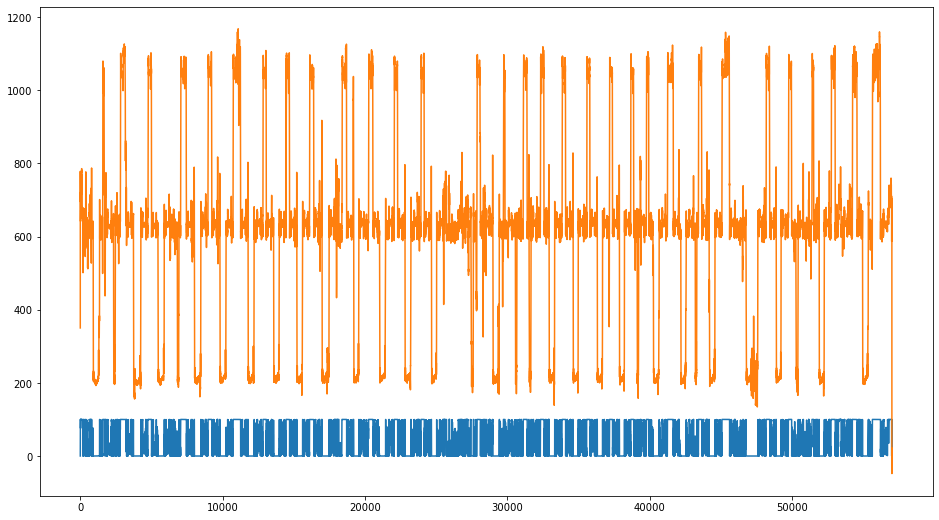

In [450]:
plt.plot(yMM_percentile)
plt.plot(yMM)
scipy.stats.pearsonr(yMM_percentile, yMM)

1940 2160
Correlation SpearmanrResult(correlation=0.10297412907870239, pvalue=0.14078294137069272)


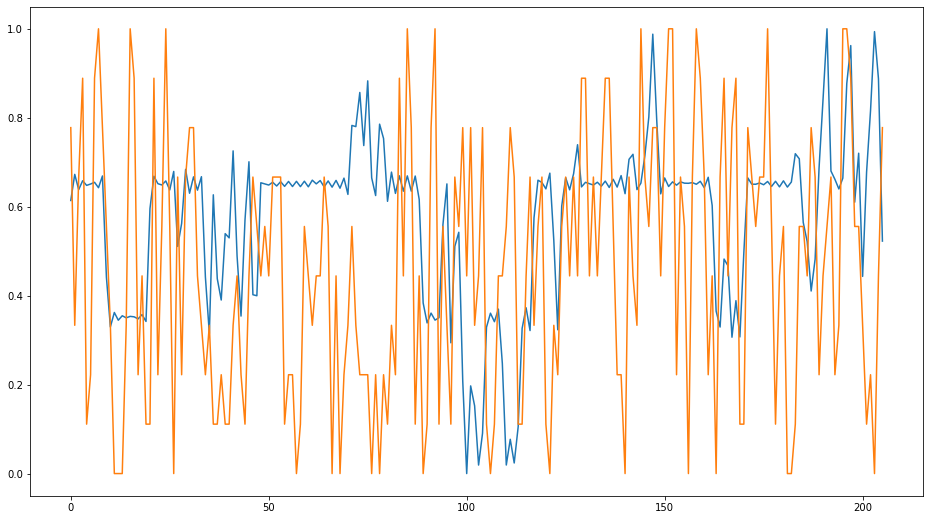

In [423]:
s, e, sect = segments[1]
print(s, e)

head_pos = yMM[s:e][9:-5]
head_pos = (head_pos - np.min(head_pos))/(np.max(head_pos) - np.min(head_pos))
theta_snippet = labels[s:e][9:-5]
theta_snippet = (theta_snippet - np.min(theta_snippet))/(np.max(theta_snippet) - np.min(theta_snippet))

plt.plot(head_pos)
plt.plot(theta_snippet)

print("Correlation", scipy.stats.spearmanr(head_pos, theta_snippet))

In [593]:
np.mean(scipy.stats.zscore(head_pos_total))

3.893384853480001e-17

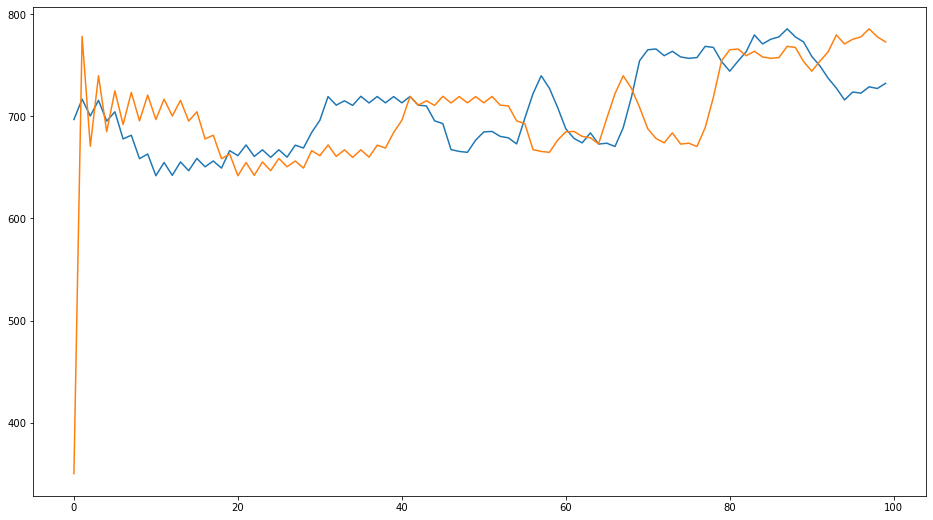

-288


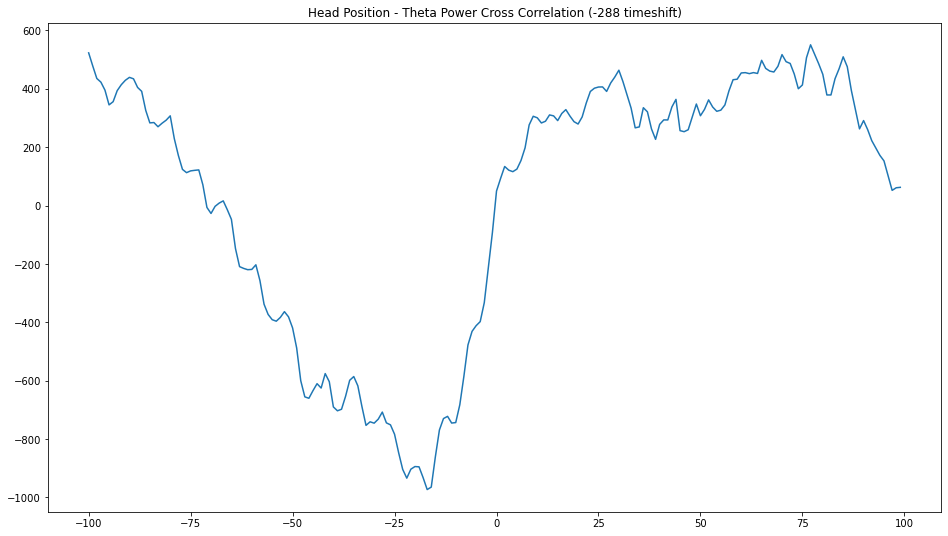

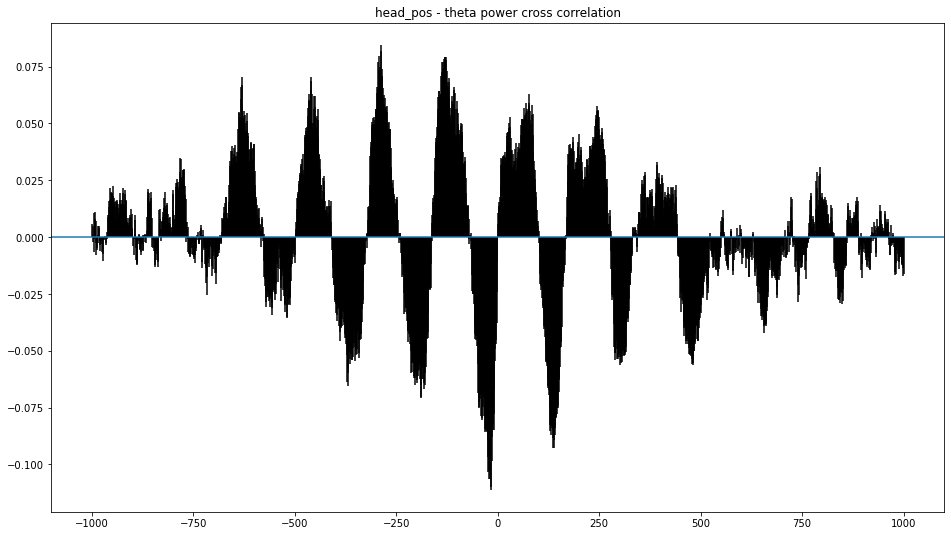

Text(0.5, 1.0, 'head_pos - head pos auto correlation')

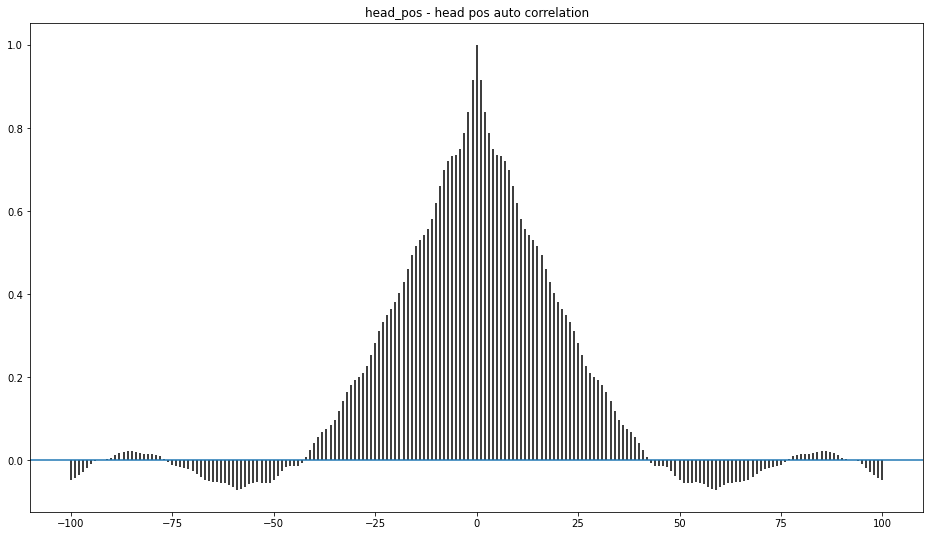

In [596]:
plt.plot(yMM[10:110])
plt.plot(yMM[:100])
plt.show()


x_correlation = scipy.signal.correlate(scipy.stats.zscore(head_pos_total), scipy.stats.zscore(theta_power_total), mode='same')
half_len = len(x_correlation)//2
radius = 100
plt.plot(range(-half_len, half_len)[half_len-radius:half_len+radius], x_correlation[half_len-radius:half_len+radius])

time_shift_x = range(-len(x_correlation)//2, len(x_correlation)//2)[np.argmax(x_correlation)]
print(time_shift_x)

plt.title("Head Position - Theta Power Cross Correlation ({} timeshift)".format(time_shift_x))
plt.show()

plt.xcorr(scipy.stats.zscore(head_pos_total), scipy.stats.zscore(theta_power_total), maxlags=1000)
plt.title('head_pos - theta power cross correlation')
plt.show()

plt.acorr(scipy.stats.zscore(head_pos_total), maxlags=100)
plt.title('head_pos - head pos auto correlation')

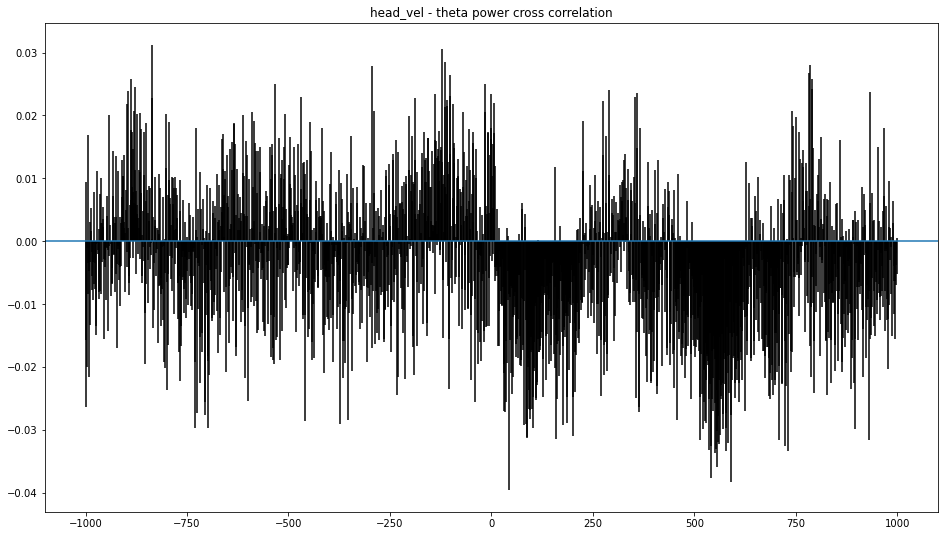

Text(0.5, 1.0, 'head_vel - head pos auto correlation')

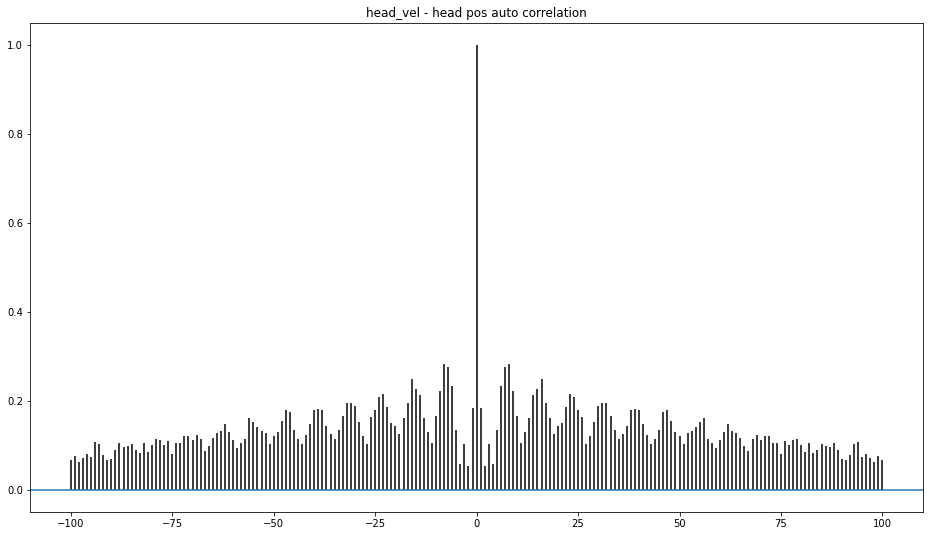

In [598]:
plt.xcorr(scipy.stats.zscore(head_vel_total), scipy.stats.zscore(theta_power_total), maxlags=1000)
plt.title('head_vel - theta power cross correlation')
plt.show()

plt.acorr(scipy.stats.zscore(head_vel_total), maxlags=100)
plt.title('head_vel - head pos auto correlation')

(array([ 167.,  304.,  677., 1055., 1966., 2277., 1413.,  537.,  213.,
         151.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

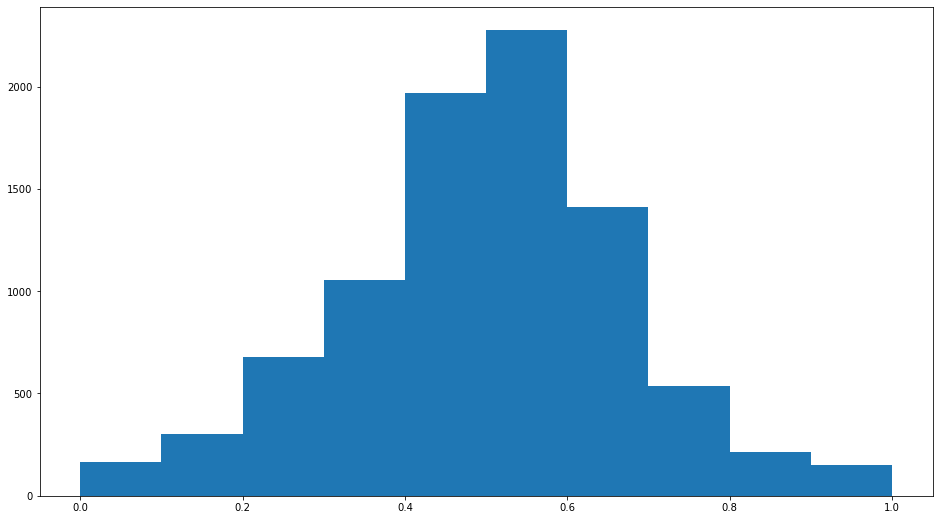

In [600]:
plt.hist(head_vel_total)

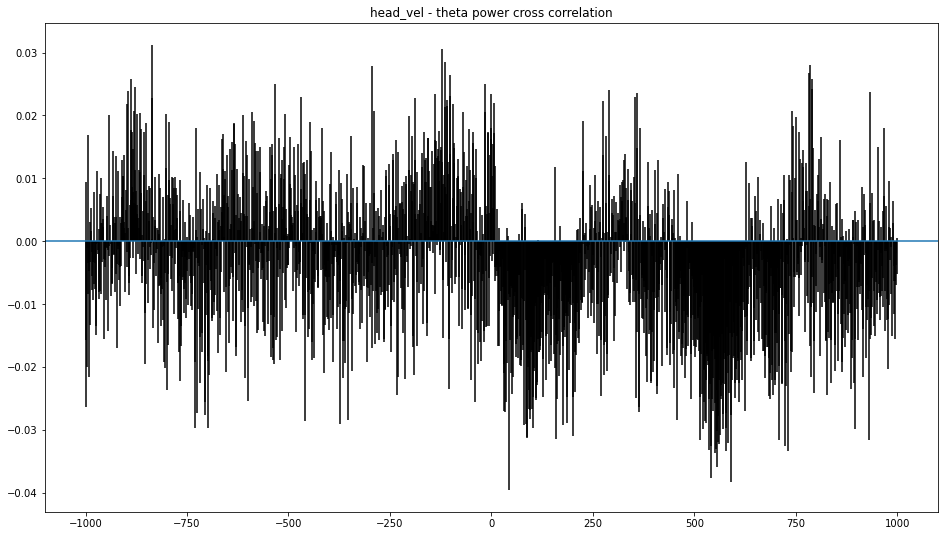

Text(0.5, 1.0, 'head_vel - head pos auto correlation')

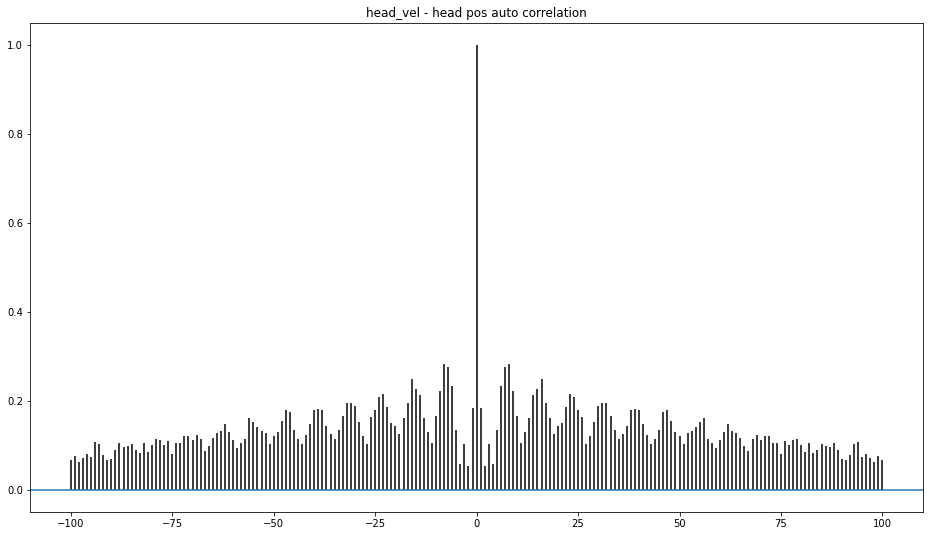

In [599]:
plt.xcorr(scipy.stats.zscore(np.abs(head_vel_total)), scipy.stats.zscore(theta_power_total), maxlags=1000)
plt.title('head_vel - theta power cross correlation')
plt.show()

plt.acorr(scipy.stats.zscore(head_vel_total), maxlags=100)
plt.title('head_vel - head pos auto correlation')

In [588]:
np.corrcoef(head_pos_total, theta_power_total)

array([[1.        , 0.00569388],
       [0.00569388, 1.        ]])

In [592]:
np.corrcoef(head_pos_total[:-20], head_pos_total[20:])

array([[1.        , 0.38352291],
       [0.38352291, 1.        ]])

662 698
1940 2160
2604 2664
3378 3572
4382 4603
5131 5324
6030 6245
6593 6617
7583 7791
8598 8809
9371 9563
10369 10573
11386 11597
12445 12649
13195 13441
14106 14312
14827 15021
15745 15938
16526 16710
17606 17789
17875 17917
18830 19023
19705 19893
20678 20871
21698 21878
22414 22601
23467 23643
24282 24470
25259 25457
27014 27052
28531 28713
30095 30300
30851 30881
31828 32010
32066 32096
32693 32729
33452 33643
34208 34380
35103 35283
35937 36119
36810 36981
37506 37718
38348 38528
39393 39597
40065 40087
40889 41095
41779 41963
42787 42973
43769 43952
44702 44879
45727 45895
47716 47906
48541 48709
49348 49519
50552 50733
51637 51674
52382 52562
53673 53936
54680 54708
56433 56710


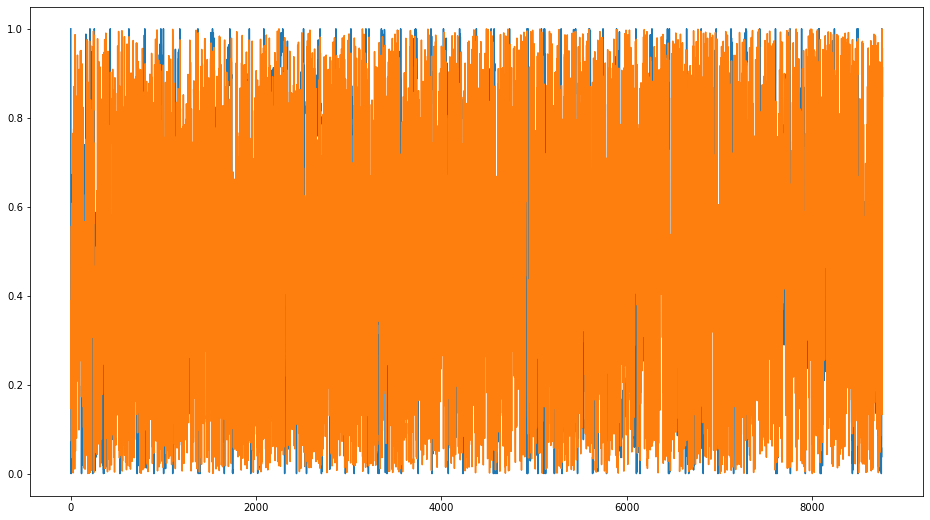

In [503]:
head_pos_total = []
head_vel_total = []
theta_power_total = []

for i in range(len(segments)):
    s, e, sect = segments[i]
    if(s != 23653):
        print(s, e)

        trim_s, trim_e = 10, -10

        head_pos = yMM[s:e][trim_s:trim_e]
        head_pos = head_pos - np.median(head_pos)
        head_pos = (head_pos - np.min(head_pos))/(np.max(head_pos) - np.min(head_pos))

        head_vel = v_y[s:e][trim_s:trim_e]
        head_vel -= np.mean(head_vel)
        head_vel = (head_vel - np.min(head_vel))/(np.max(head_vel) - np.min(head_vel))

        theta_snippet = data_percentile[s:e][trim_s:trim_e]
        theta_snippet = np.array(theta_snippet)/100
        
        assert len(theta_snippet) == len(head_pos)

        head_pos_total += list(head_pos)
        head_vel_total += list(head_vel)
        theta_power_total += list(theta_snippet)
        
        x_correlation = scipy.signal.correlate(head_pos_total, theta_power_total, mode='same')
        plt.xcorr(scipy.stats.zscore(np.abs(head_vel_total)), scipy.stats.zscore(theta_power_total), maxlags=1000)

    half_len = len(x_correlation)//2
    plt.plot(range(-half_len, half_len), x_correlation)

    time_shift_x = range(-len(x_correlation)//2, len(x_correlation)//2)[np.argmax(x_correlation)]
    print(time_shift_x)

    plt.title("Head Position - Theta Power Cross Correlation ({} timeshift)".format(time_shift_x))
    plt.show()
    
plt.plot(head_pos_total)
plt.plot(theta_power_total)

662 698
1940 2160
Correlation (nan, nan)
Correlation (-0.10864036463684709, 0.1256921875360071)
2604 2664
3378 3572
Correlation (-0.08758096079170645, 0.25049211063512805)
Correlation (0.08468088030026111, 0.26658423714968477)
4382 4603
Correlation (-0.014737353474938354, 0.8355052094752311)
Correlation (0.027180807538603316, 0.7017035486044586)
5131 5324
Correlation (-0.212816097859367, 0.004936594223183267)
Correlation (0.06528250050265062, 0.39346907100282286)
6030 6245
Correlation (-0.06790799304643061, 0.34553966078976744)
Correlation (0.07906958231760458, 0.27186881733657764)
6593 6617
7583 7791
Correlation (-0.22554334161914139, 0.0018578118363937423)
Correlation (0.14624616796741463, 0.04521666667754829)
8598 8809
Correlation (0.1745882062497276, 0.015709293124270017)
Correlation (-0.14635132050871275, 0.04335961242355215)
9371 9563
Correlation (0.07067228624730834, 0.3569186855690224)
Correlation (0.04916450771737531, 0.5218656189222806)
10369 10573
Correlation (-0.09752465363

ValueError: maxlags must be None or strictly positive < 148

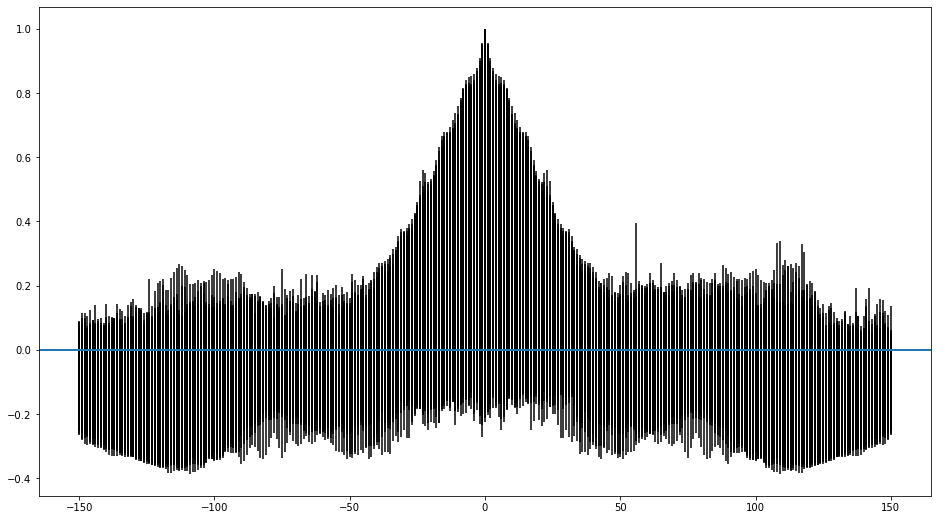

In [635]:
pos_theta_corr = []
vel_theta_corr = []
pos_pos_corr = []
abs_vel_theta_corr = []

for i in range(len(segments)):
    s, e, sect = segments[i]
    print(s, e)
    if(e-s > 150):
        trim_s, trim_e = 10, -10

        head_pos = yMM[s:e][trim_s:trim_e]
        #head_pos = head_pos - np.median(head_pos)
        head_pos = scipy.stats.zscore(head_pos)
        #head_pos = (head_pos - np.min(head_pos))/(np.max(head_pos) - np.min(head_pos))

        head_vel = v_y[s:e][trim_s:trim_e]
        #head_vel -= np.mean(head_vel)
        #head_vel = (head_vel - np.min(head_vel))/(np.max(head_vel) - np.min(head_vel))
        head_vel = scipy.stats.zscore(head_vel)
        theta_snippet = theta_sub10hz[s:e][trim_s:trim_e]
        theta_snippet = scipy.stats.zscore(theta_snippet)
        #theta_snippet = np.array(theta_snippet)/100
        #theta_snippet = (theta_snippet - np.min(theta_snippet))/(np.max(theta_snippet) - np.min(theta_snippet))

        print("Correlation", scipy.stats.pearsonr(head_pos, theta_snippet))
        print("Correlation", scipy.stats.pearsonr(head_vel, theta_snippet))
        
        if(False):
            fig, axs = plt.subplots(6, 1, constrained_layout = True)
            axs[0].plot(head_pos, label='head_pos')
            axs[0].plot(theta_snippet, label='theta_power_percentile')
            axs[0].set_title("Head Pos (relative to mean head position) vs Theta Power Percentile")
            axs[0].legend()

            axs[1].plot(head_vel, label='head velocity')
            axs[1].plot(theta_snippet, label='theta_power_percentile')
            axs[1].set_title("Head Velocity (relative to mean head vel) vs Theta Power Percentile")
            axs[1].legend()

            axs[2].xcorr(head_pos, head_pos, maxlags=len(head_pos)-1)
            axs[2].set_title('Auto-correlation Head Position')
            axs[2].set_ylim(0,1)

            axs[3].xcorr(head_pos, theta_snippet, maxlags=len(head_pos)-1)
            axs[3].set_title('Cross-correlation Head Position and Theta Snippet')
            axs[3].set_ylim(0,1)

            axs[4].xcorr(head_vel, head_vel, maxlags=len(head_vel)-1)
            axs[4].set_title('Auto-correlation Head Velocity')
            axs[4].set_ylim(0,1)

            axs[5].xcorr(head_vel, theta_snippet, maxlags=len(head_vel)-1)
            axs[5].set_title('Cross-correlation Head Velocity and Theta Snippet')
            axs[5].set_ylim(0,1)


            plt.show()

        lags, c, line, b = plt.xcorr(scipy.stats.zscore(np.abs(v_y[s:e][trim_s:trim_e])), theta_snippet, maxlags=150)
        abs_vel_theta_corr.append(c)

        lags, c, line, b = plt.xcorr(head_vel, theta_snippet, maxlags=150)
        vel_theta_corr.append(c)

        lags, c, line, b = plt.xcorr(head_pos, theta_snippet, maxlags=150)
        pos_theta_corr.append(c)

        lags, c, line, b = plt.xcorr(head_pos, head_pos, maxlags=150)
        pos_pos_corr.append(c)

In [639]:
np.array(c).shape

(41, 301)

(301,)


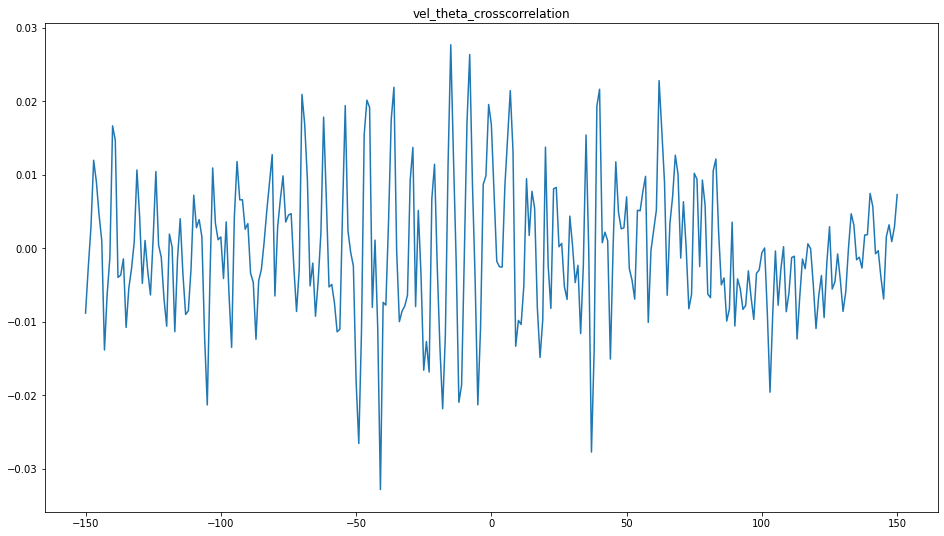

(301,)


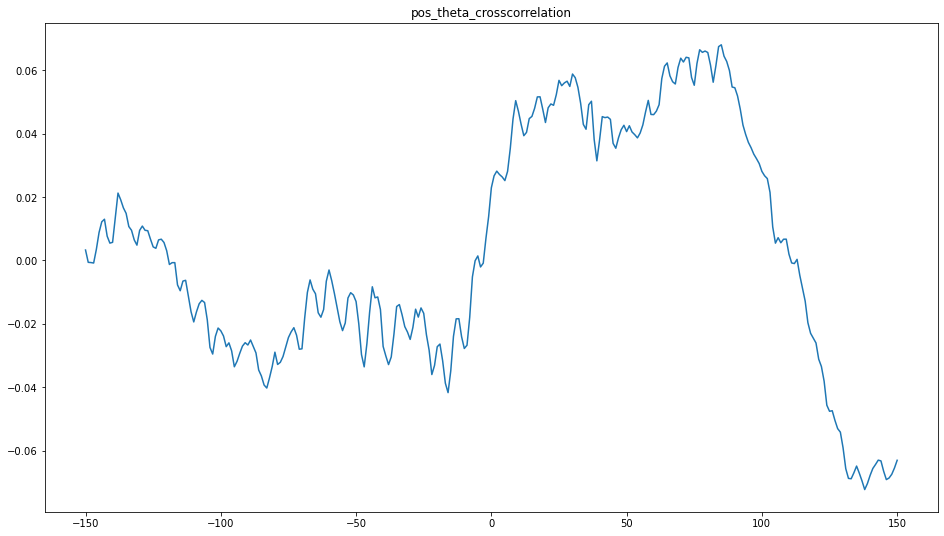

(301,)


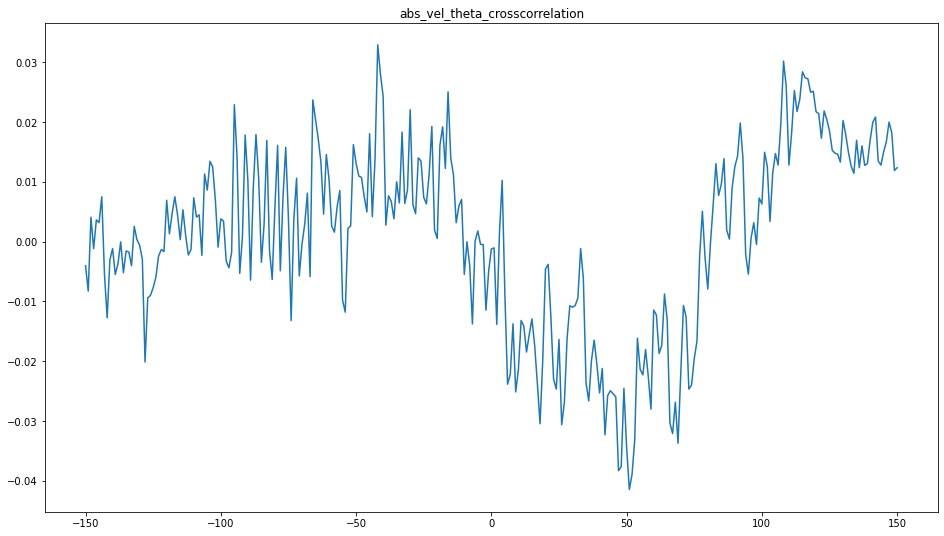

(301,)


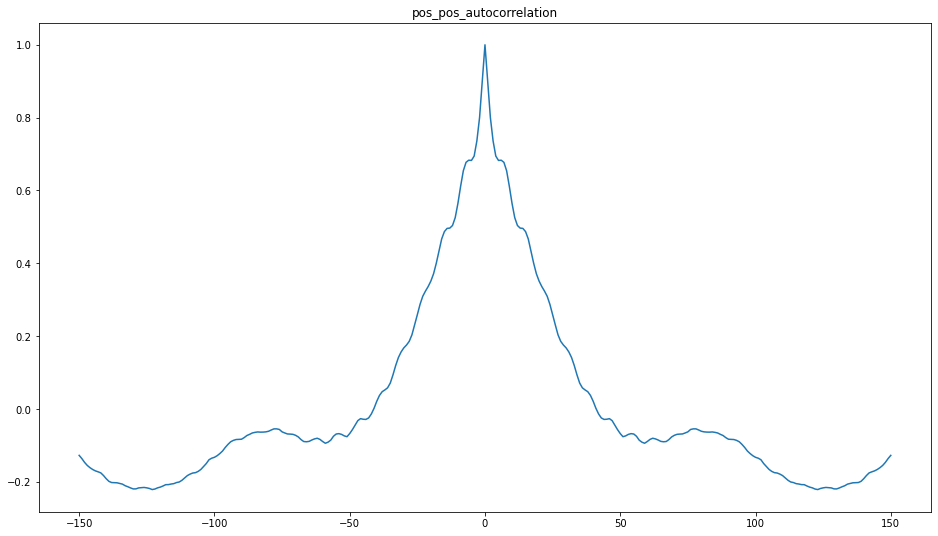

In [640]:
c = vel_theta_corr
print(np.mean(np.array(c),axis=0).shape)
plt.title('vel_theta_crosscorrelation')
plt.plot(np.arange(-150,151), np.mean(np.array(c),axis=0))
plt.show()

c = pos_theta_corr
print(np.mean(np.array(c),axis=0).shape)
plt.title('pos_theta_crosscorrelation')
plt.plot(np.arange(-150,151), np.mean(np.array(c),axis=0))
plt.show()

c = abs_vel_theta_corr
print(np.mean(np.array(c),axis=0).shape)
plt.title('abs_vel_theta_crosscorrelation')
plt.plot(np.arange(-150,151), np.mean(np.array(c),axis=0))
plt.show()

c = pos_pos_corr
print(np.mean(np.array(c),axis=0).shape)
plt.title('pos_pos_autocorrelation')
plt.plot(np.arange(-150,151), np.mean(np.array(c),axis=0))
plt.show()

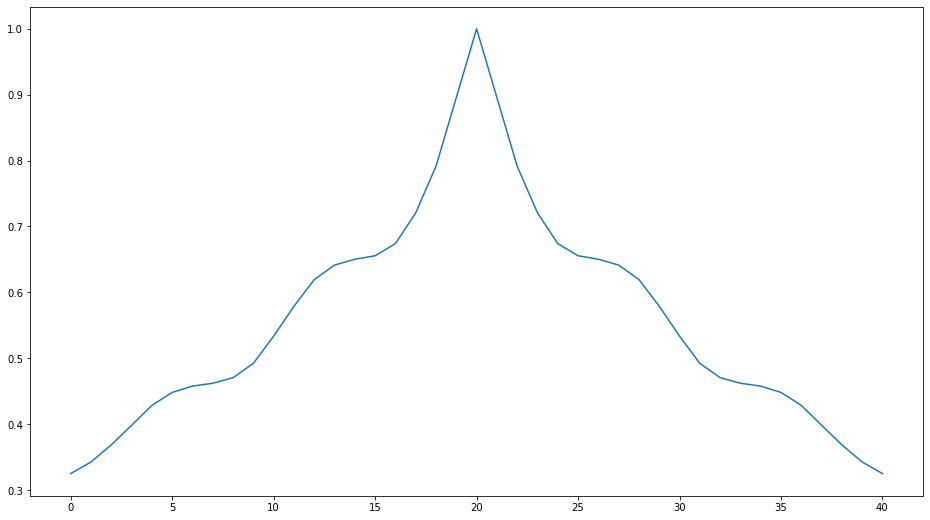

662 698
Correlation SpearmanrResult(correlation=-0.007322852814278949, pvalue=0.976993817231541)


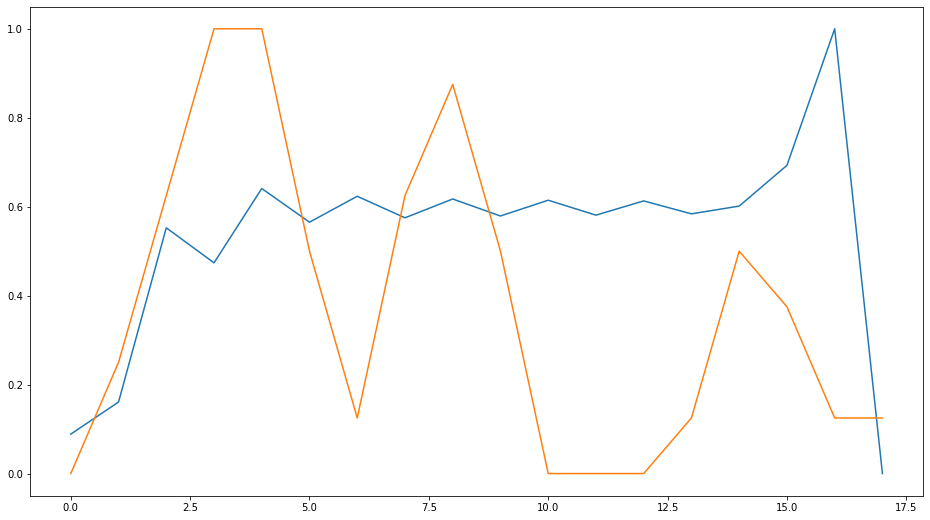

1940 2160
Correlation SpearmanrResult(correlation=0.06376114927879245, pvalue=0.3673171546416456)


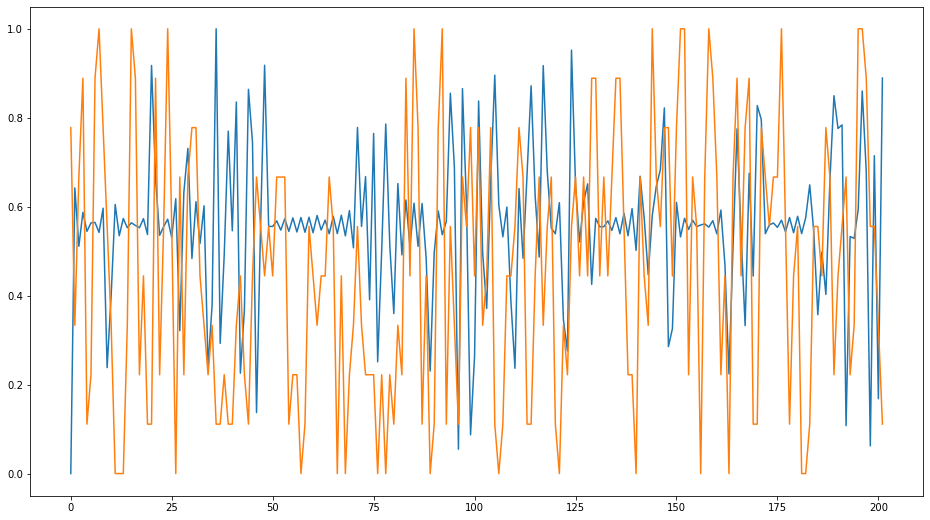

2604 2664
Correlation SpearmanrResult(correlation=-0.18629197425191185, pvalue=0.23750341002294528)


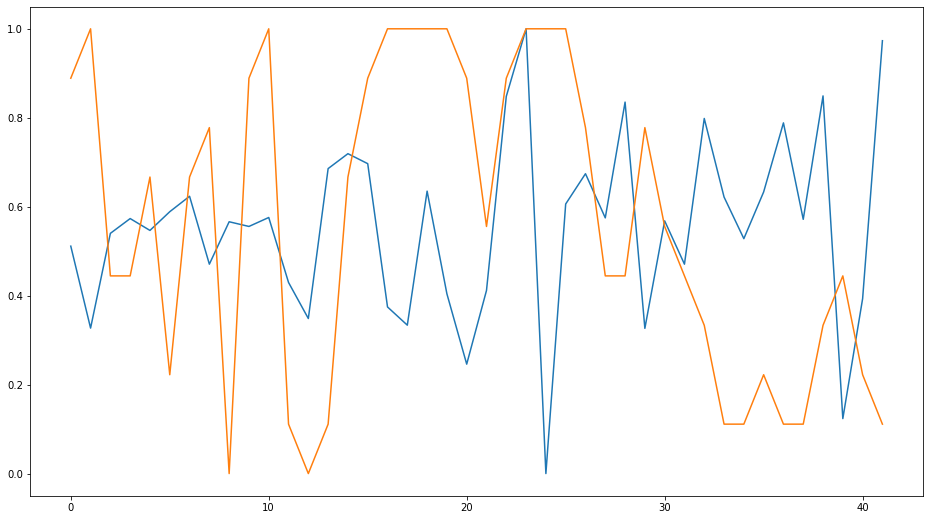

3378 3572
Correlation SpearmanrResult(correlation=-0.07405702027370999, pvalue=0.32865888539020005)


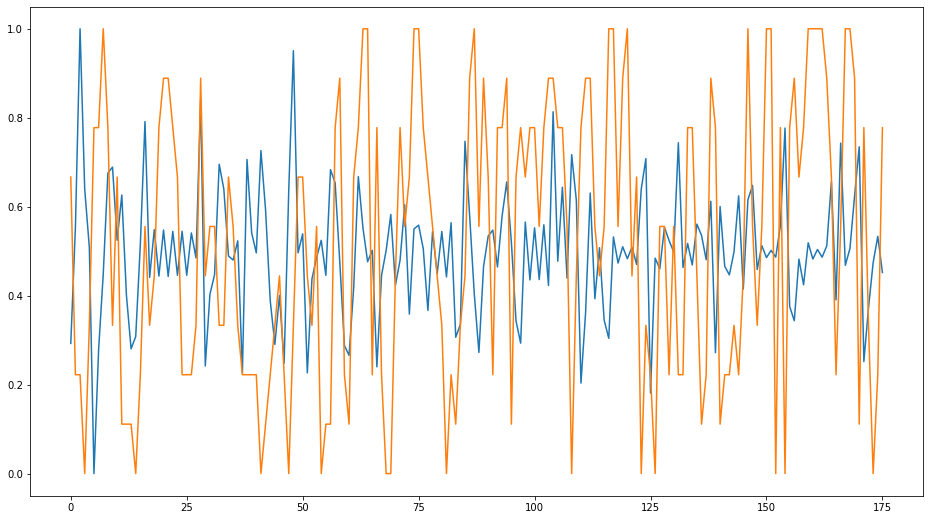

4382 4603
Correlation SpearmanrResult(correlation=0.05413778695162565, pvalue=0.4429956834464467)


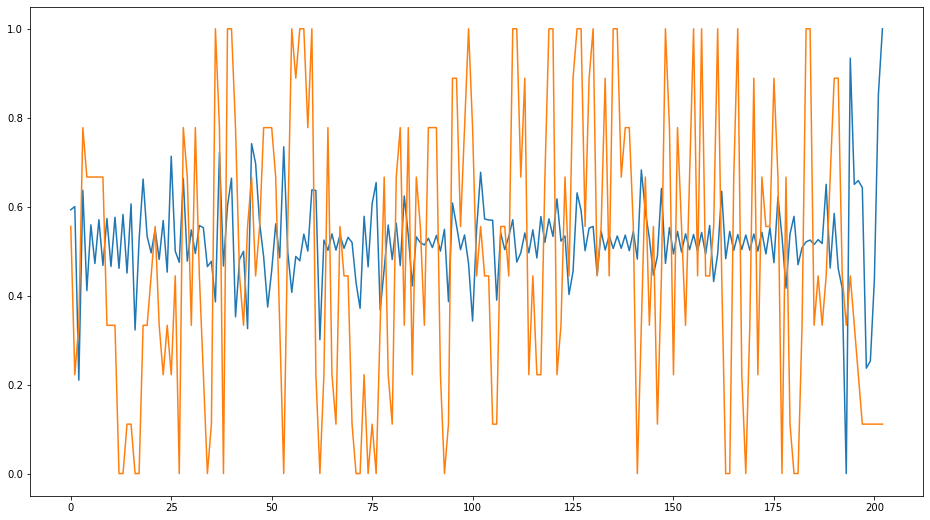

5131 5324
Correlation SpearmanrResult(correlation=0.04007802308739088, pvalue=0.5984751856841444)


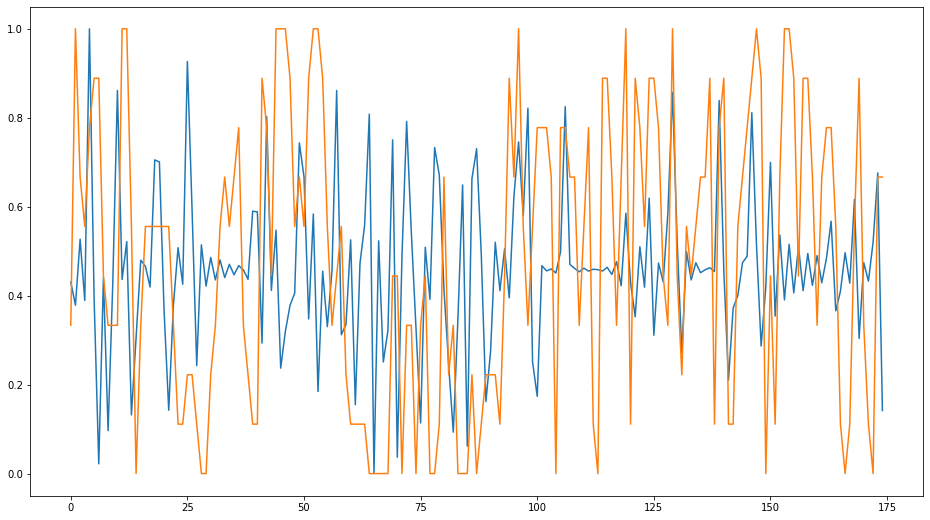

6030 6245
Correlation SpearmanrResult(correlation=-0.04638943297783828, pvalue=0.5174301480184624)


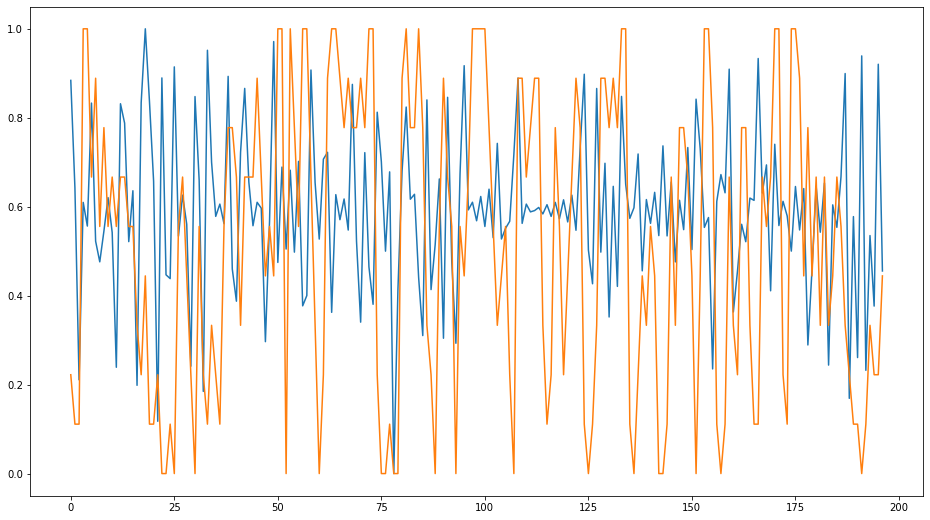

6593 6617
Correlation SpearmanrResult(correlation=0.0, pvalue=1.0)


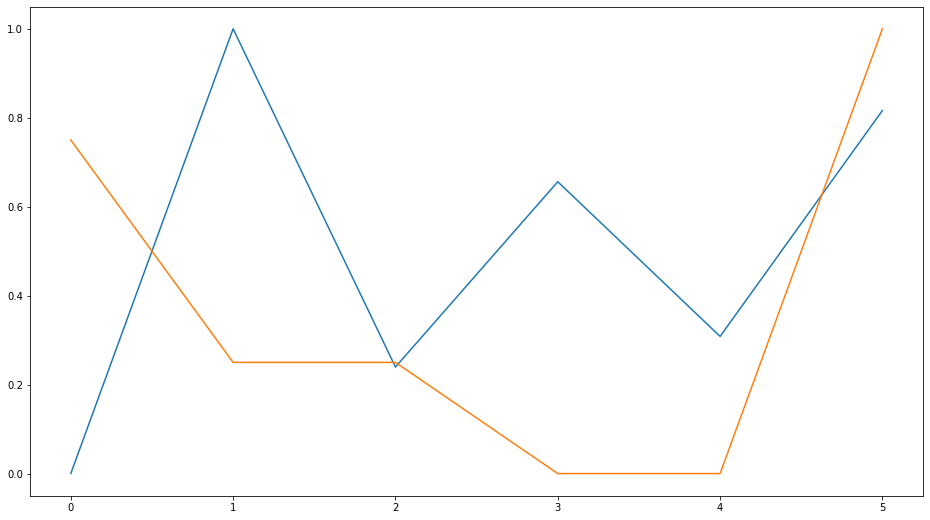

7583 7791
Correlation SpearmanrResult(correlation=0.12443118616976369, pvalue=0.08717321404940581)


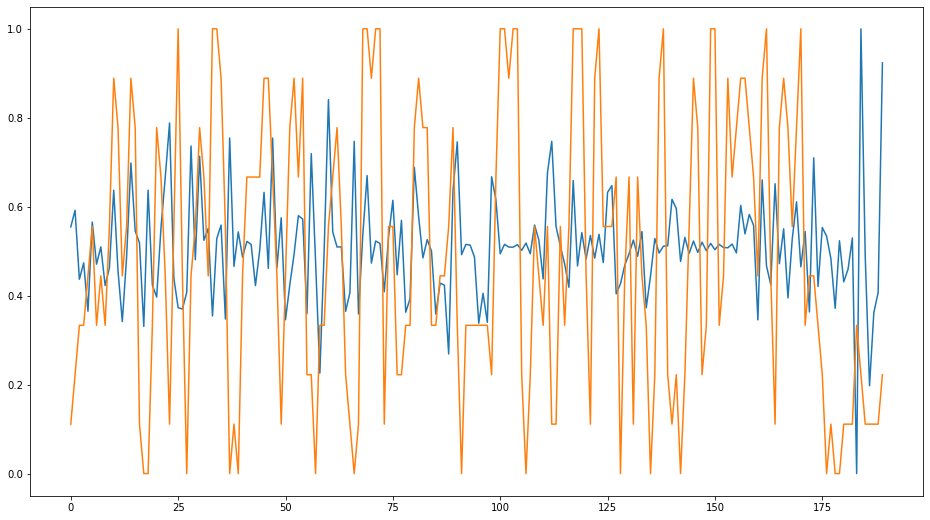

8598 8809
Correlation SpearmanrResult(correlation=0.1417875245353231, pvalue=0.04919151243513337)


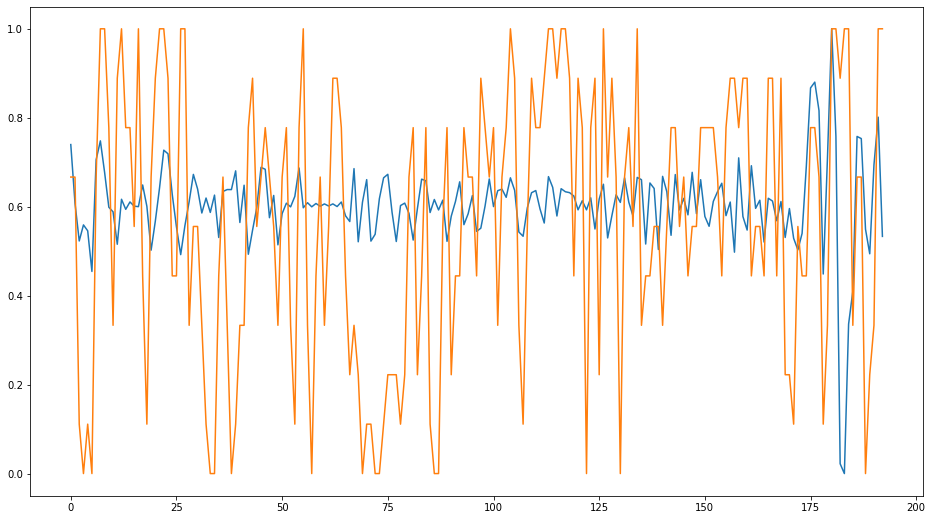

9371 9563
Correlation SpearmanrResult(correlation=-0.0026274874082619433, pvalue=0.9725508597359613)


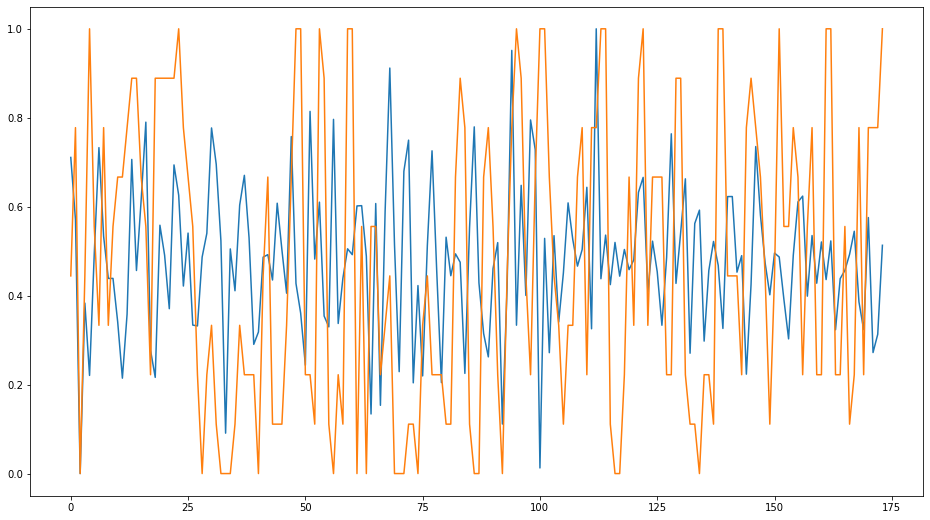

10369 10573


ValueError: zero-size array to reduction operation minimum which has no identity

In [454]:
for i in range(len(segments)):
    s, e, sect = segments[i]
    print(s, e)
    
    trim_s, trim_e = 9, -9
    
    
    theta_snippet = labels[s:e][trim_s:trim_e]
    theta_snippet = theta_snippet/10
    #theta_snippet = (theta_snippet - np.min(theta_snippet))/(np.max(theta_snippet) - np.min(theta_snippet))
    
    
    
    plt.plot(head_vel, label='head velocity')
    plt.plot(theta_snippet, label='theta_power_percentile')
    plt.title("Head Velocity (relative to mean head vel) vs Theta Power Percentile")
    plt.show()

    